In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
import matplotlib.animation as animation
import scipy.stats as stats
import cartopy
import cartopy.crs as ccrs
from functools import reduce
import tsunamibayes as tb
from matplotlib.image import imread

In [2]:
%matplotlib notebook

In [3]:
plt.style.use('seaborn')

In [4]:
dirs = glob.glob("3*/")
samples = []
model_params = []
model_output = []
bayes_data = []
debug = []
data = (['samples','model_params','model_output','bayes_data','debug'],
             [samples,model_params,model_output,bayes_data,debug])

for dir_ in dirs:
    for kind,lst in zip(*data):
        k=6001
        if kind=='debug':
            k=6000
        df = pd.read_csv(dir_+kind+'.csv',index_col=0).iloc[k:].reset_index(drop=True)
#         df['chain_id'] = dir_[:-4]
        lst.append(df)

In [5]:
all_samples = pd.concat(samples,ignore_index=True)
all_model_params = pd.concat(model_params,ignore_index=True)
all_model_output = pd.concat(model_output,ignore_index=True)
all_bayes_data = pd.concat(bayes_data,ignore_index=True)
all_debug = pd.concat(debug,ignore_index=True)

In [6]:
parameters = {'latitude':'Latitude','longitude':'Longitude','magnitude':'Magnitude','delta_logl':'$\Delta \log L$',
              'delta_logw':'$\Delta \log W$','depth_offset':'Depth offset'}

In [7]:
obs_loc = np.array([[129.775, -4.5175], # Pulu Ai
           [128.178, -3.691], # Ambon
           [129.8965, -4.5248], # Banda Neira
           [127.113, -3.3815], # Buru
           [128.557, -3.543], # Hulaliu
           [128.657, -3.576], # Saparua
           [128.562, -3.501], # Kulur
           [128.807, -3.6455], # Ameth
           [128.921, -3.338]]) # Amahai
obs_names = ['Pulu Ai','Ambon','Banda Neira','Buru','Hulaliu','Saparua','Kulur','Ameth','Amahai']

In [8]:
name_loc = obs_loc.copy()
name_loc[0] = (name_loc[0,0]-.5,name_loc[0,1]-.15)
name_loc[1] = (name_loc[1,0]-.5,name_loc[1,1]-.2)
name_loc[2] = (name_loc[2,0]+.05,name_loc[2,1]+.05)
name_loc[3] = (name_loc[3,0]+.05,name_loc[3,1]+.05)
name_loc[4] = (128.25,-4.1)
name_loc[5] = (name_loc[5,0]+.05,name_loc[5,1])
name_loc[-1] = (name_loc[-1,0]+.07,name_loc[-1,1]+.07)
name_loc[-2] = (name_loc[-2,0],name_loc[-2,1]-.15)
name_loc[-3] = (name_loc[-3,0]-.4,name_loc[-3,1])
name_loc[4] = (128.25,-4.1)

# Basic Info

In [13]:
np.mean([df['accepted'].sum()/len(df) for df in debug])

0.2367656514180935

<IPython.core.display.Javascript object>


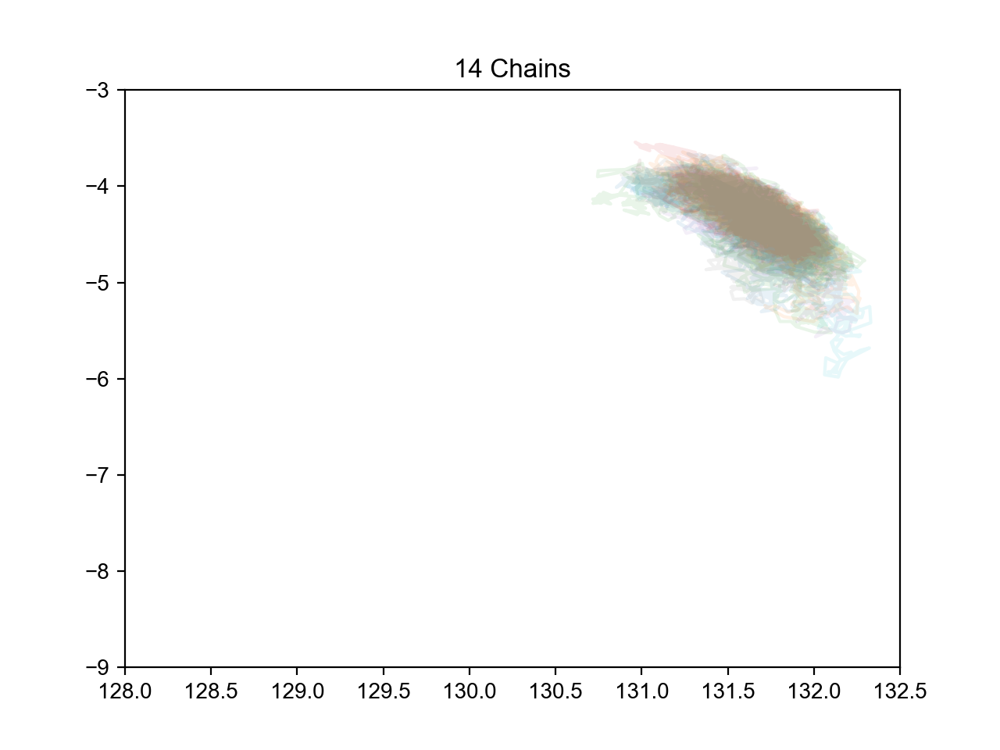

In [6]:
fig = plt.figure()
plt.xlim((128,132.5))
plt.ylim((-9,-3))
for sample in samples:
    plt.plot(sample['longitude'],sample['latitude'],alpha=.1)
    
plt.title("14 Chains")
plt.show()

<IPython.core.display.Javascript object>


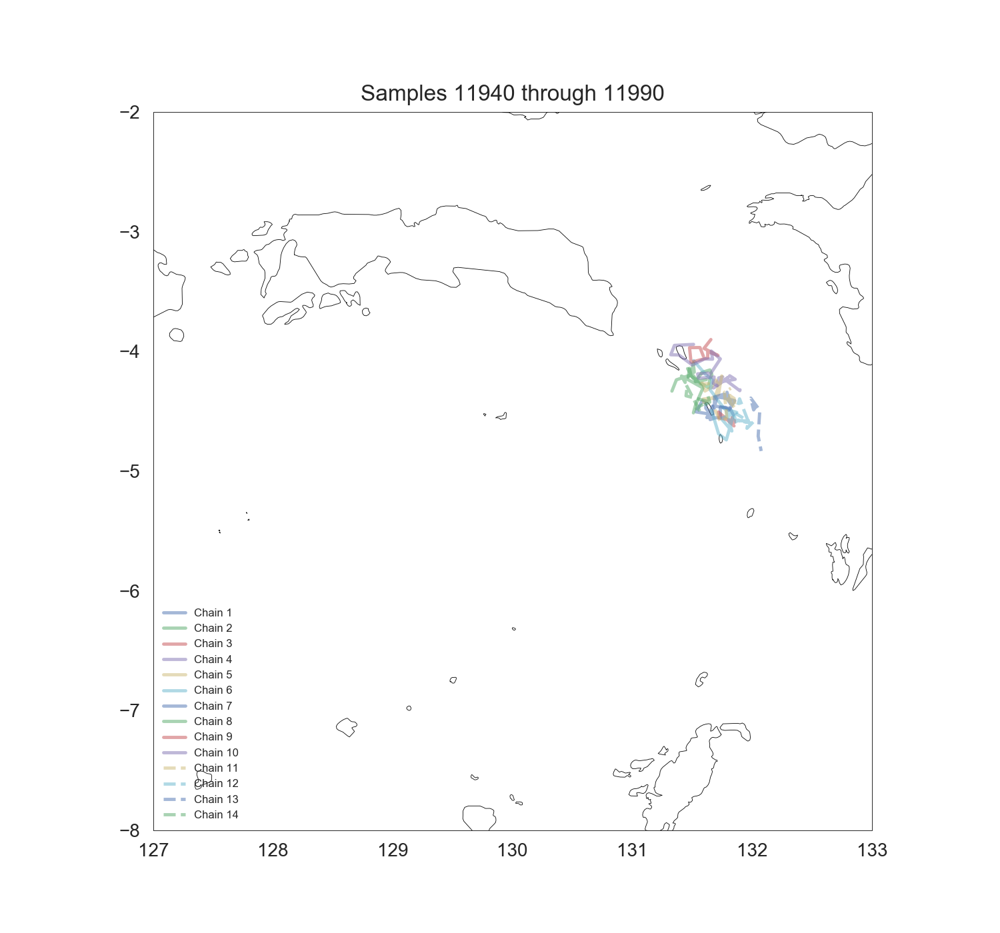

In [9]:
crs = ccrs.PlateCarree()
fig = plt.figure(figsize=(7.5,7))
ax = plt.axes(projection=crs)
ax.set_extent((130.5,132.5,-5.5,-3.5))
ax.coastlines(resolution='10m')
plt.xticks(np.arange(127,134))
plt.yticks(np.arange(-8,-1))
lines = [ax.plot([],[],alpha=.5,label=f'Chain {i}')[0] for i in range(1,11)]
lines += [ax.plot([],[],'--',alpha=.5,label=f'Chain {i}')[0] for i in [11,12,13,14]]
plt.legend(loc='lower left',prop={'size': 6})

def update(i):
    for line,arr in zip(lines,samples):
        line.set_data(arr['longitude'].iloc[max(10*i-50,0):10*i],arr['latitude'].iloc[max(10*i-50,0):10*i])
    plt.title("Samples {} through {}".format(max(10*i-50,0),10*i))

ani = animation.FuncAnimation(fig,update,frames=int(max([len(df) for df in samples])/10)+1,interval=50)
ani.save('14chains.mp4')
# plt.show()

<IPython.core.display.Javascript object>


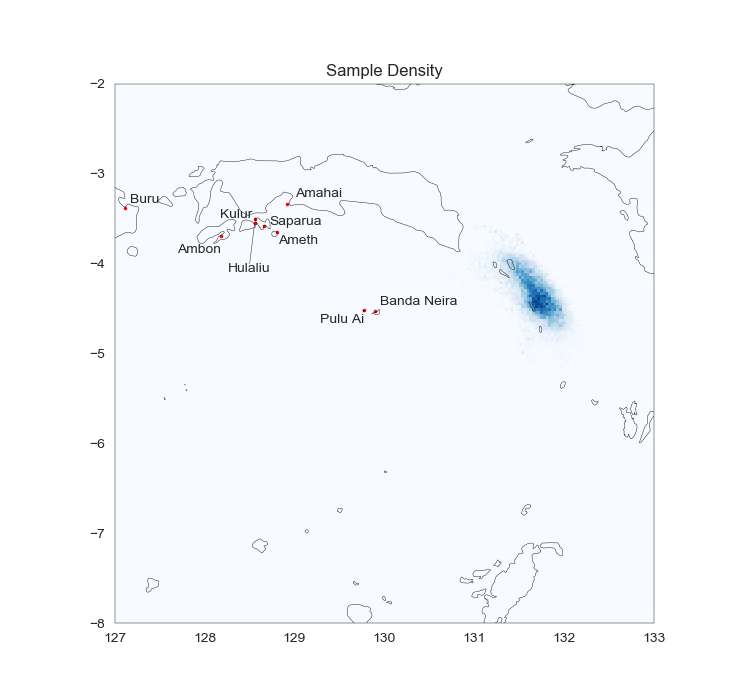

In [16]:
crs = ccrs.PlateCarree()
fig = plt.figure(figsize=(7.5,7))
ax = plt.axes(projection=crs)
ax.set_extent((127,133,-8,-2))
ax.coastlines(resolution='10m')
plt.xticks(np.arange(127,134))
plt.yticks(np.arange(-8,-1))
plt.hist2d(all_samples['longitude'],all_samples['latitude'],cmap='Blues',bins=200,range=[[127,133],[-8,-2]])
plt.scatter(obs_loc[:,0],obs_loc[:,1],s=5,c='r')
for loc,name in zip(name_loc,obs_names):
    plt.annotate(name,loc+.01)
plt.plot(np.linspace(128.5,obs_loc[4,0],100),np.linspace(-4,obs_loc[4,1],100),color='k',linewidth=.3)
plt.title("Sample Density")
plt.savefig('plots/sample_density.pdf')

In [29]:
ocean = cartopy.feature.NaturalEarthFeature(category='physical', name='ocean',
                            scale='10m', facecolor=cartopy.feature.COLORS['water'])

In [7]:
ocean?

<IPython.core.display.Javascript object>


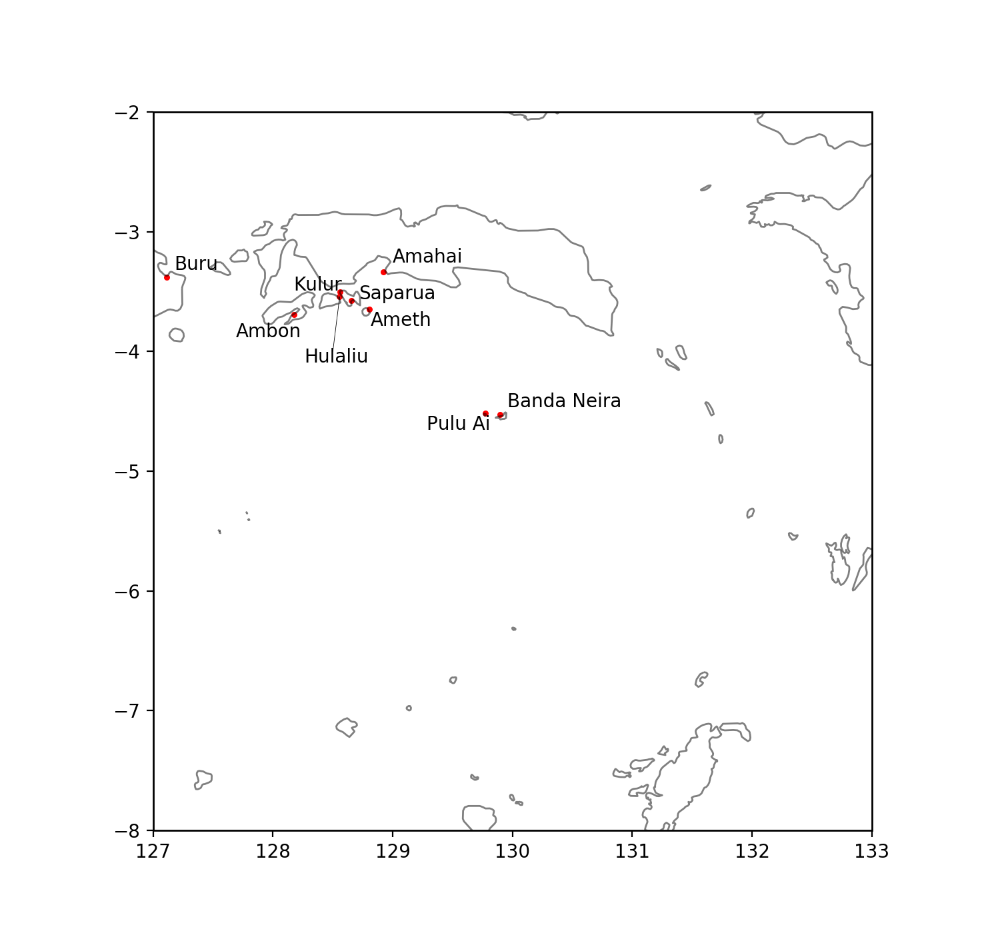

In [19]:
plt.style.use('default')
fig = plt.figure(figsize=(7.5,7))
ax = plt.axes(projection=crs)
ax.set_extent((127,133,-8,-2))
ax.coastlines(resolution='10m',alpha=.5)
# ax.imshow(imread('NE1_50M_SR_W/NE1_50M_SR_W.tif'), origin='upper',extent=[-180, 180, -90, 90])
# ax.add_feature(ocean)
# ax.add_feature(cartopy.feature.LAND)
plt.xticks(np.arange(127,134))
plt.yticks(np.arange(-8,-1))
# plt.hist2d(all_samples['longitude'],all_samples['latitude'],cmap='Blues',bins=200,range=[[127,133],[-8,-2]])
plt.scatter(obs_loc[:,0],obs_loc[:,1],s=5,c='r')
for loc,name in zip(name_loc,obs_names):
    plt.annotate(name,loc+.01)
plt.plot(np.linspace(128.5,obs_loc[4,0],100),np.linspace(-4,obs_loc[4,1],100),color='k',linewidth=.3)
plt.savefig('plots/obslocations.pdf')

In [28]:
cartopy.config['data_dir']

'/Users/hringer/.local/share/cartopy'

<IPython.core.display.Javascript object>


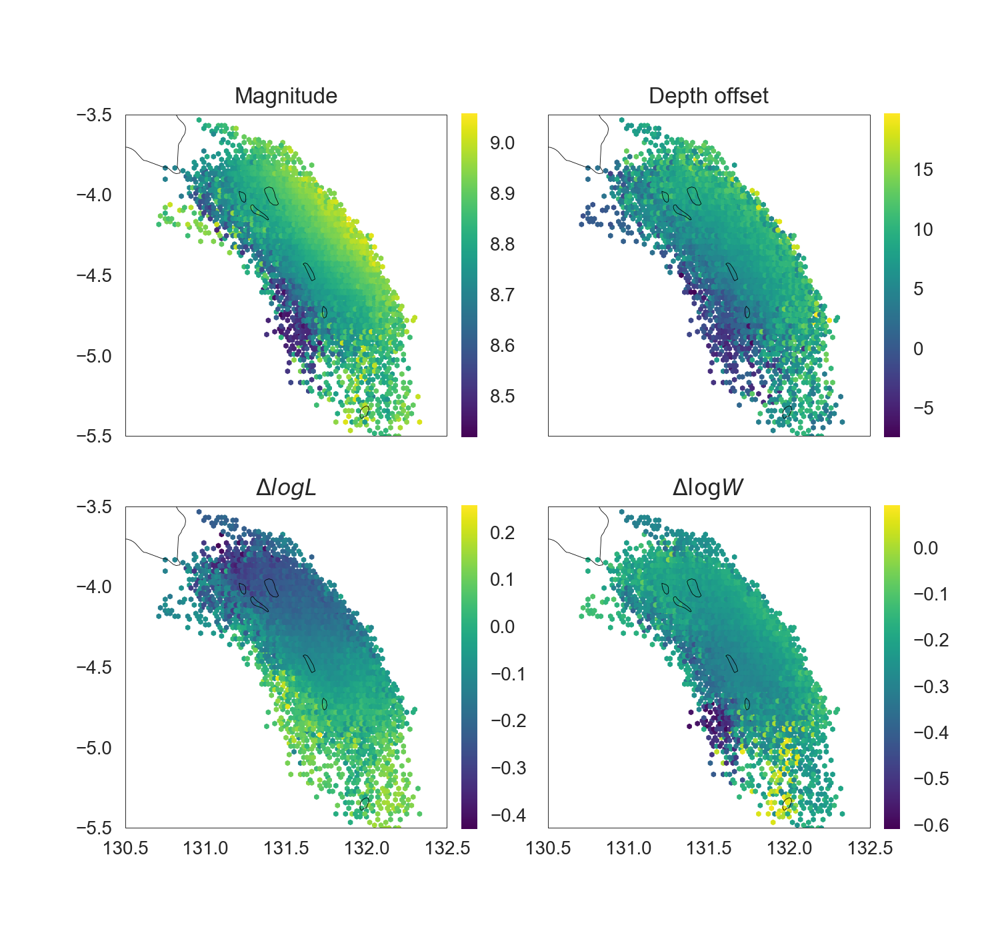

In [15]:
plt.style.use('seaborn')
fig = plt.figure(figsize=(7.5,7))

ax = plt.subplot(2,2,1,projection=crs)
ax.set_extent((130.5,132.5,-5.5,-3.5))
ax.coastlines(resolution='10m')
# plt.xticks([130.5,131,131.5,132,132.5])
plt.yticks([-5.5,-5,-4.5,-4,-3.5])
plt.hexbin(all_samples['longitude'],all_samples['latitude'],
           C=all_samples['magnitude'],
           reduce_C_function=np.mean,
           cmap='viridis',
           extent=(130.5,132.5,-5.5,-3.5))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title("Magnitude")

ax = plt.subplot(2,2,2,projection=crs)
ax.set_extent((130.5,132.5,-5.5,-3.5))
ax.coastlines(resolution='10m')
# plt.xticks([130.5,131,131.5,132,132.5])
# plt.yticks([-5.5,-5,-4.5,-4,-3.5])
plt.hexbin(all_samples['longitude'],all_samples['latitude'],
           C=all_samples['depth_offset'],
           reduce_C_function=np.mean,
           cmap='viridis',
           extent=(130.5,132.5,-5.5,-3.5))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title("Depth offset")

ax = plt.subplot(2,2,3,projection=crs)
ax.set_extent((130.5,132.5,-5.5,-3.5))
ax.coastlines(resolution='10m')
plt.xticks([130.5,131,131.5,132,132.5])
plt.yticks([-5.5,-5,-4.5,-4,-3.5])
plt.hexbin(all_samples['longitude'],all_samples['latitude'],
           C=all_samples['delta_logl'],
           reduce_C_function=np.mean,
           cmap='viridis',
           extent=(130.5,132.5,-5.5,-3.5))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title("$\Delta log L$")

ax = plt.subplot(2,2,4,projection=crs)
ax.set_extent((130.5,132.5,-5.5,-3.5))
ax.coastlines(resolution='10m')
plt.xticks([130.5,131,131.5,132,132.5])
# plt.yticks([-5.5,-5,-4.5,-4,-3.5])
plt.hexbin(all_samples['longitude'],all_samples['latitude'],
           C=all_samples['delta_logw'],
           reduce_C_function=np.mean,
           cmap='viridis',
           extent=(130.5,132.5,-5.5,-3.5))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title("$\Delta \log W$")

plt.savefig('plots/all_by_latlon.pdf')

<IPython.core.display.Javascript object>


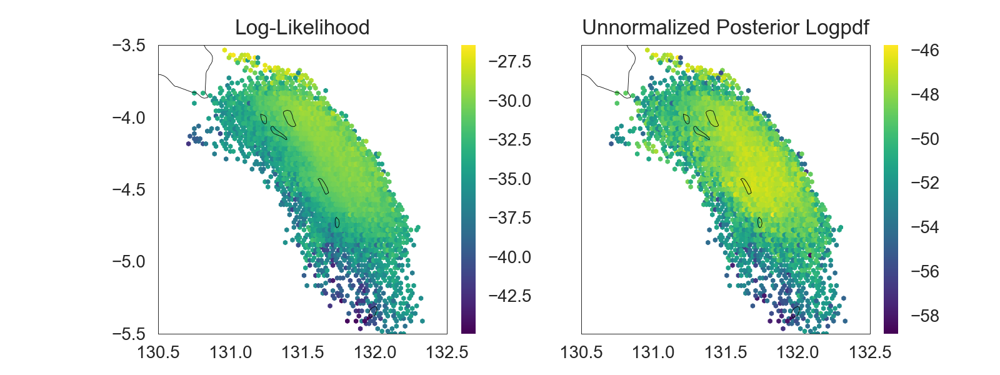

In [16]:
fig = plt.figure(figsize=(8,3))

ax = plt.subplot(1,2,1,projection=crs)
ax.set_extent((130.5,132.5,-5.5,-3.5))
ax.coastlines(resolution='10m')
plt.xticks([130.5,131,131.5,132,132.5])
plt.yticks([-5.5,-5,-4.5,-4,-3.5])
plt.hexbin(all_samples['longitude'],all_samples['latitude'],
           C=all_bayes_data['llh'],
           reduce_C_function=np.mean,
           cmap='viridis',
           extent=(130.5,132.5,-5.5,-3.5))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title("Log-Likelihood")

ax = plt.subplot(1,2,2,projection=crs)
ax.set_extent((130.5,132.5,-5.5,-3.5))
ax.coastlines(resolution='10m')
plt.xticks([130.5,131,131.5,132,132.5])
# plt.yticks([-5.5,-5,-4.5,-4,-3.5])
plt.hexbin(all_samples['longitude'],all_samples['latitude'],
           C=all_bayes_data['posterior_logpdf'],
           reduce_C_function=np.mean,
           cmap='viridis',
           extent=(130.5,132.5,-5.5,-3.5))
plt.colorbar(fraction=0.046, pad=0.04)
plt.title("Unnormalized Posterior Logpdf")

plt.savefig('plots/llh_postlogpdf_by_latlon.pdf')

In [211]:
all_bayes_data['llh'].argmax()

37948

In [213]:
all_samples.loc[37948]

latitude        -3.58975
longitude        131.174
magnitude        8.90736
delta_logl     -0.214872
delta_logw     -0.277067
depth_offset      9.0542
chain_id        36174054
Name: 37948, dtype: object

In [17]:
all_model_params.loc[37948]

latitude            -3.589752
longitude          131.174108
length          350470.455677
width            99305.040965
slip                18.507888
strike             116.808696
dip                  7.569397
depth             8679.965074
rake                90.000000
depth_offset         9.054198
Name: 37948, dtype: float64

In [214]:
all_bayes_data['posterior_logpdf'].argmax()

12915

In [215]:
all_samples.loc[12915]

latitude         -4.42649
longitude         131.859
magnitude         8.84126
delta_logl     -0.0291801
delta_logw      -0.297992
depth_offset       8.3213
chain_id         36180893
Name: 12915, dtype: object

In [16]:
all_model_params.loc[12915]

latitude            -4.426495
longitude          131.859085
length          496303.347966
width            90420.738671
slip                11.423944
strike             144.041920
dip                 12.771633
depth            13755.111301
rake                90.000000
depth_offset         8.321297
Name: 12915, dtype: float64

In [217]:
all_debug['llh'].argmax()

37945

In [218]:
all_debug['llh'].max()

-26.44718729588937

In [219]:
all_debug.loc[37945]

latitude                 -3.58975
longitude                 131.174
magnitude                 8.90736
delta_logl              -0.214872
delta_logw              -0.277067
depth_offset               9.0542
p_latitude               -3.50042
p_longitude               131.221
p_magnitude               8.95606
p_delta_logl            -0.217809
p_delta_logw            -0.272561
p_depth_offset            8.15804
m_latitude               -3.58975
m_longitude               131.174
length                     350470
width                       99305
slip                      18.5079
strike                    116.809
dip                        7.5694
depth                     8679.97
rake                           90
m_depth_offset             9.0542
p_m_latitude             -3.50042
p_m_longitude             131.221
p_length                   369151
p_width                    103765
p_slip                    19.8966
p_strike                  117.611
p_dip                     6.32093
p_depth       

In [30]:
means = [df.expanding().mean() for df in samples]
_vars = [df.expanding().var() for df in samples]

In [31]:
W = reduce(lambda x, y: x.add(y), _vars)/len(_vars)

In [32]:
mean = reduce(lambda x, y: x.add(y), means)/len(means)

In [33]:
mean_vars = [(df-mean)**2 for df in means]
B = len(samples[0])*reduce(lambda x, y: x.add(y), mean_vars)/(len(mean_vars)-1)

In [34]:
var_hat = (1-(1/len(samples[0])))*W+(1/len(samples[0]))*B

In [35]:
R = (var_hat/W)**0.5

In [36]:
R

,latitude,longitude,magnitude,delta_logl,delta_logw,depth_offset
0,NaN,NaN,NaN,NaN,NaN,NaN
1,2.241559,2.760108,1.731440,4.086566,1.973847,3.703869
2,2.604506,3.224121,2.003836,4.740221,2.406502,4.341747
3,2.252355,3.438035,2.073067,4.632545,2.774151,4.789088
4,2.252256,3.479264,2.198378,4.847407,2.958295,5.033838
...,...,...,...,...,...,...
11994,1.042065,1.027656,1.025719,1.071479,1.031332,1.072885
11995,1.042065,1.027655,1.025723,1.071473,1.031328,1.072890
11996,1.042065,1.027655,1.025727,1.071467,1.031325,1.072893
11997,1.042065,1.027655,1.025729,1.071460,1.031323,1.072897


<IPython.core.display.Javascript object>


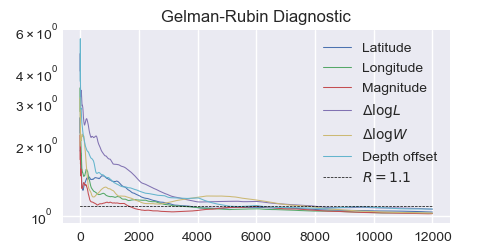

In [37]:
fig = plt.figure(figsize=(5,2.5))

for key in ['latitude','longitude','magnitude','delta_logl','delta_logw','depth_offset']:
    plt.semilogy(R[key],label=parameters[key],linewidth=.75)
plt.semilogy(1.1*np.ones(len(R)),'--k',label='$R=1.1$',linewidth=.5)
plt.legend()
plt.title('Gelman-Rubin Diagnostic')
# plt.show()
plt.savefig('plots/gelman-rubin.pdf')

<IPython.core.display.Javascript object>


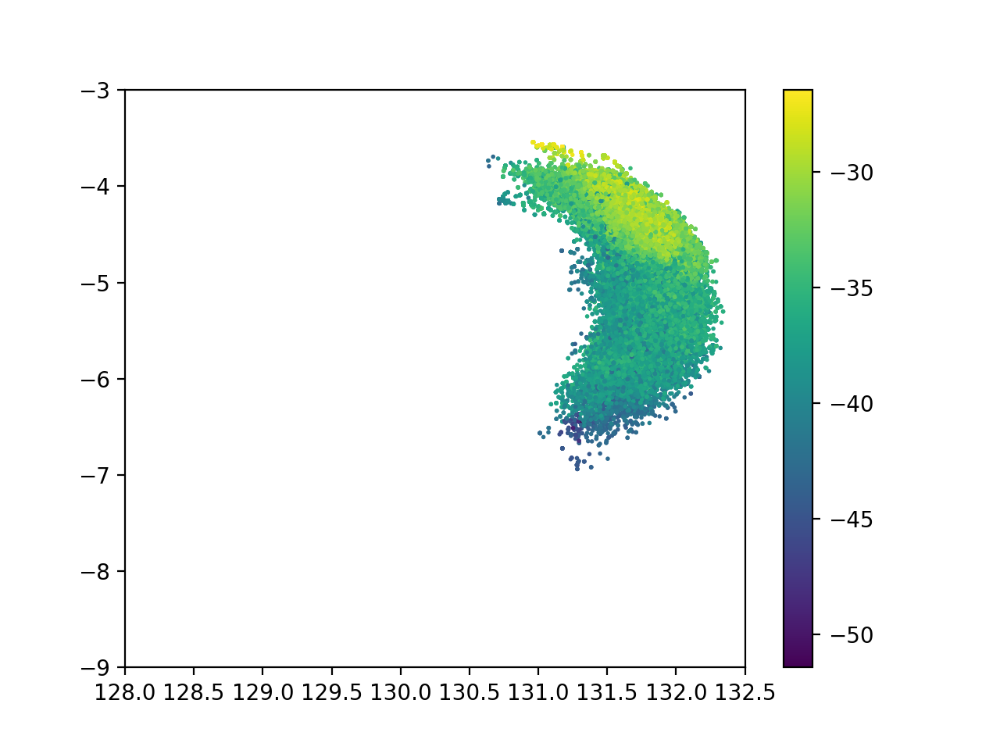

In [12]:
n = 1
fig = plt.figure()
plt.scatter(all_samples['longitude'].iloc[::n],all_samples['latitude'].iloc[::n],c=all_bayes_data['llh'].iloc[::n],s=1)
plt.colorbar()
plt.xlim((128,132.5))
plt.ylim((-9,-3))
plt.show()

<IPython.core.display.Javascript object>


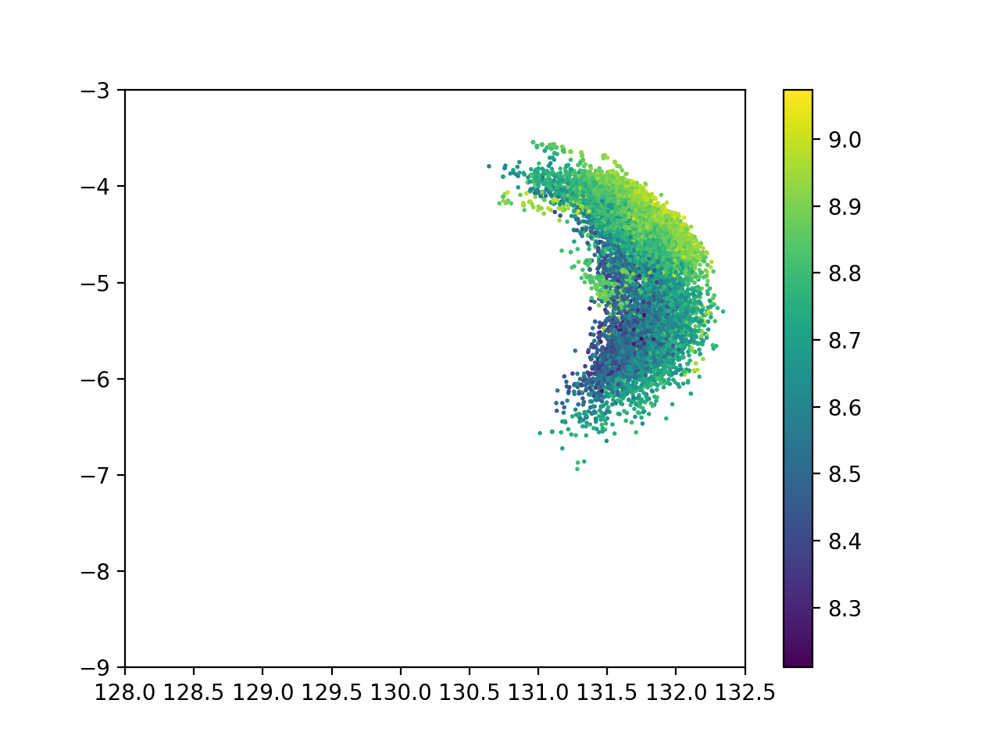

In [13]:
n = 10
fig = plt.figure()
plt.scatter(all_samples['longitude'].iloc[::n],all_samples['latitude'].iloc[::n],c=all_samples['magnitude'].iloc[::n],s=1)
plt.colorbar()
plt.xlim((128,132.5))
plt.ylim((-9,-3))
plt.show()

<IPython.core.display.Javascript object>


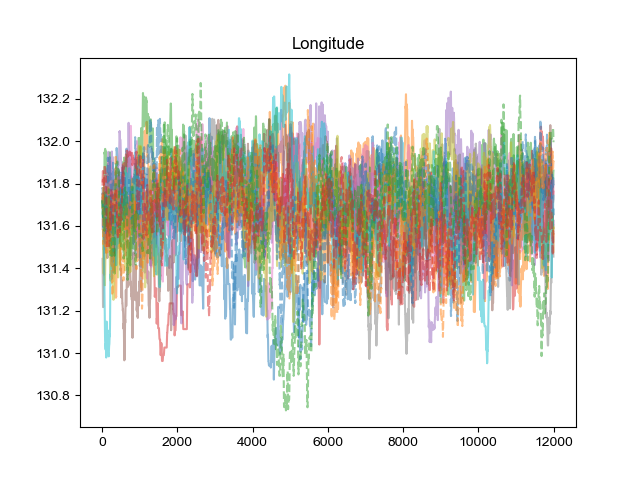

In [204]:
plt.style.use('default')
fig = plt.figure()
for i,arr in enumerate(samples[:10]):
    plt.plot(arr['longitude'].rolling(window=10).mean(),alpha=.5)#,label=arr.iloc[0]['chain_id'])
for i,arr in enumerate(samples[10:]):
    plt.plot(arr['longitude'].rolling(window=10).mean(),'--',alpha=.5)#,label=arr.iloc[0]['chain_id'])
    
# plt.xlim(0,18000)

# plt.legend()
plt.title('Longitude')
plt.show()

<IPython.core.display.Javascript object>


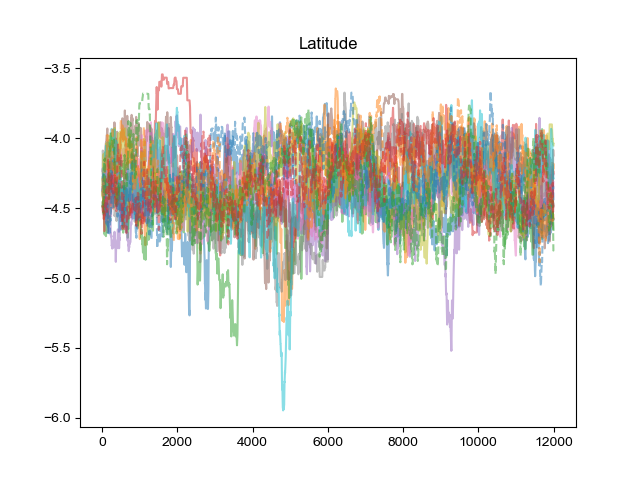

In [205]:
fig = plt.figure()
for i,arr in enumerate(samples[:10]):
    plt.plot(arr['latitude'].rolling(window=10).mean(),alpha=.5)#,label=arr.iloc[0]['chain_id'])
for i,arr in enumerate(samples[10:]):
    plt.plot(arr['latitude'].rolling(window=10).mean(),'--',alpha=.5)#,label=arr.iloc[0]['chain_id'])
    
# plt.xlim(0,18000)

# plt.legend()
plt.title('Latitude')
plt.show()

<IPython.core.display.Javascript object>


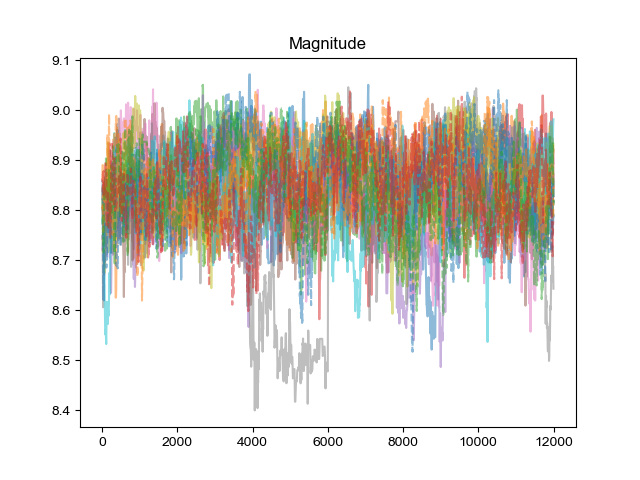

In [207]:
fig = plt.figure()
for i,arr in enumerate(samples[:10]):
    plt.plot(arr['magnitude'].rolling(window=10).mean(),alpha=.5)#,label=arr.iloc[0]['chain_id'])
for i,arr in enumerate(samples[10:]):
    plt.plot(arr['magnitude'].rolling(window=10).mean(),'--',alpha=.5)#,label=arr.iloc[0]['chain_id'])
    
# plt.xlim(0,18000)

# plt.legend()
plt.title('Magnitude')
plt.show()

<IPython.core.display.Javascript object>


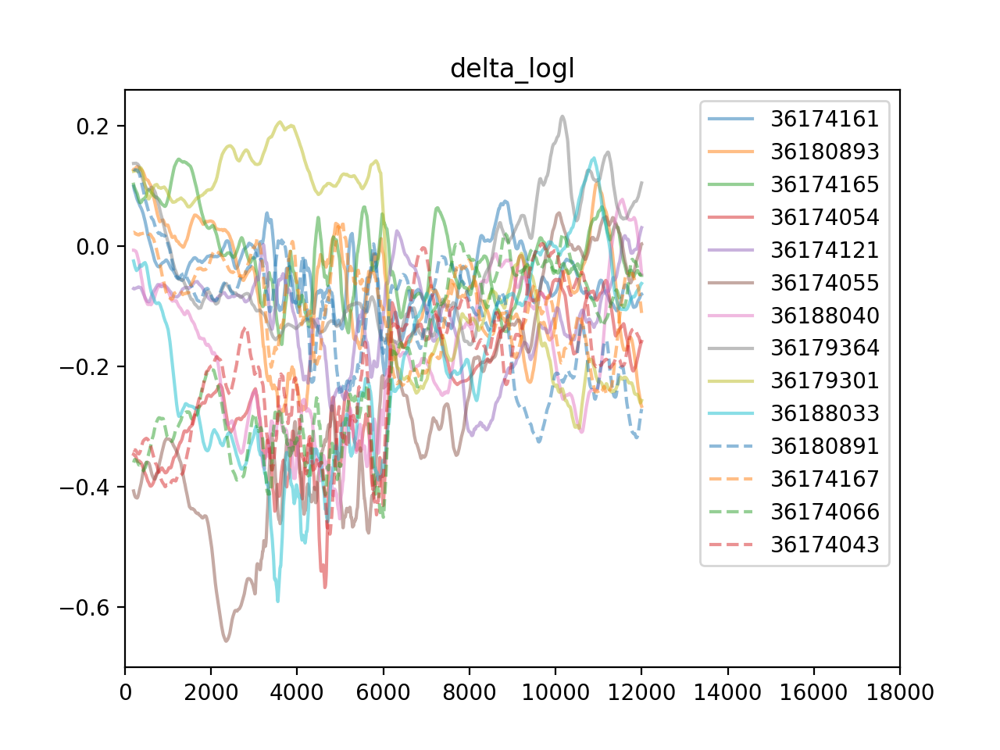

In [12]:
fig = plt.figure()
for i,arr in enumerate(samples[:10]):
    plt.plot(arr['delta_logl'].rolling(window=200).mean(),alpha=.5,label=arr.iloc[0]['chain_id'])
for i,arr in enumerate(samples[10:]):
    plt.plot(arr['delta_logl'].rolling(window=200).mean(),'--',alpha=.5,label=arr.iloc[0]['chain_id'])
    
plt.xlim(0,18000)

plt.legend()
plt.title('delta_logl')
plt.show()

<IPython.core.display.Javascript object>


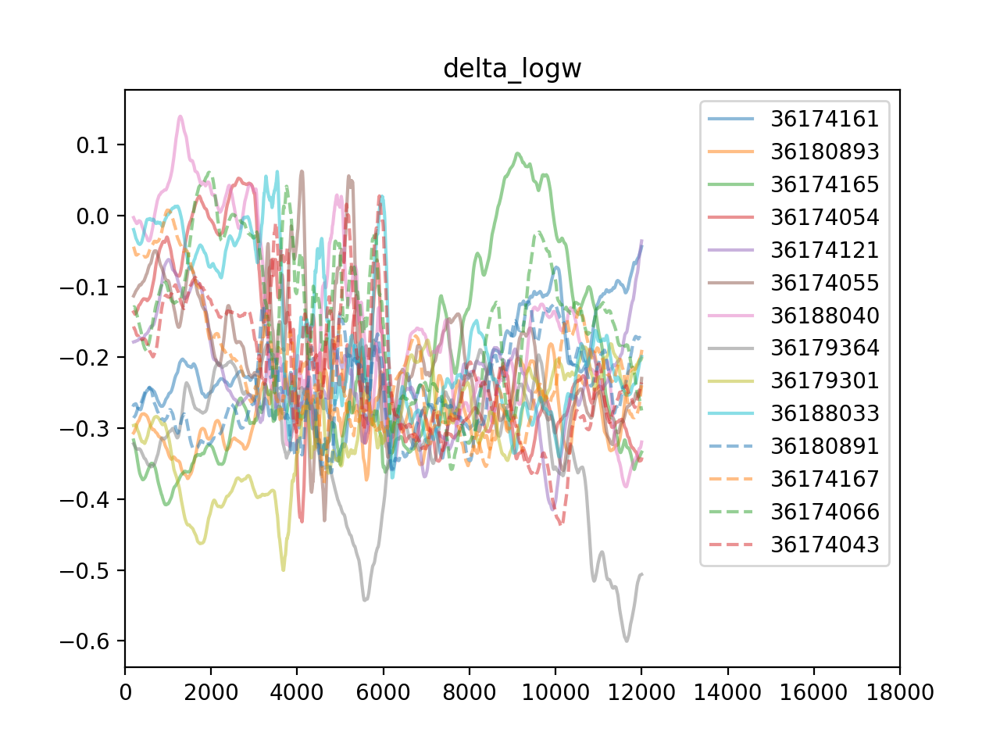

In [13]:
fig = plt.figure()
for i,arr in enumerate(samples[:10]):
    plt.plot(arr['delta_logw'].rolling(window=200).mean(),alpha=.5,label=arr.iloc[0]['chain_id'])
for i,arr in enumerate(samples[10:]):
    plt.plot(arr['delta_logw'].rolling(window=200).mean(),'--',alpha=.5,label=arr.iloc[0]['chain_id'])
    
plt.xlim(0,18000)

plt.legend()
plt.title('delta_logw')
plt.show()

<IPython.core.display.Javascript object>


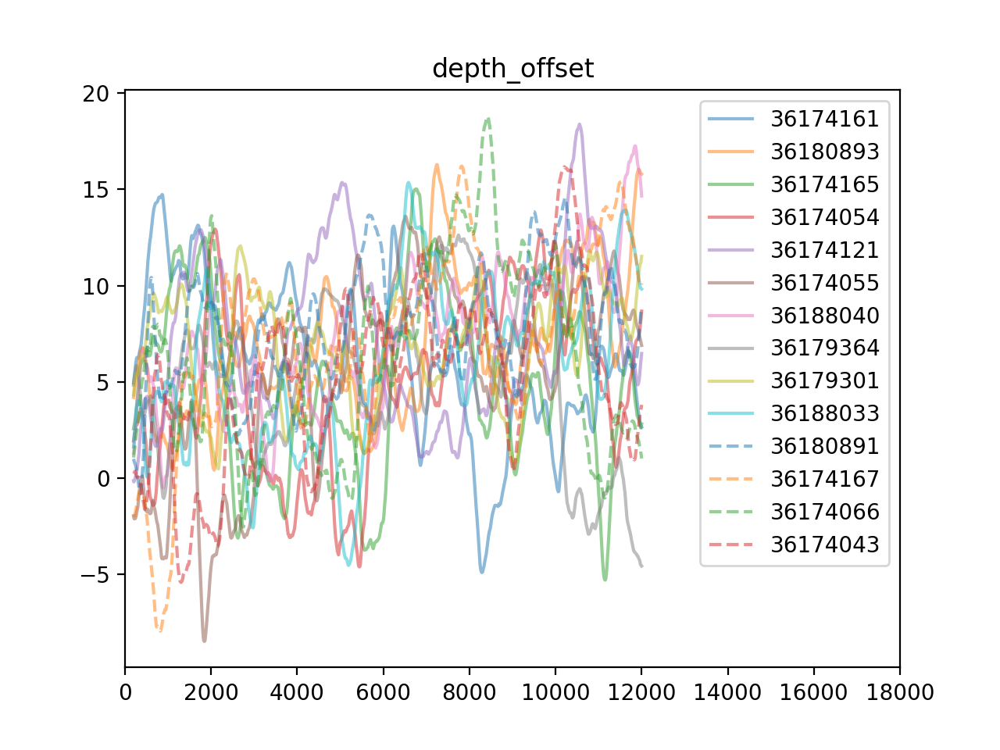

In [14]:
fig = plt.figure()
for i,arr in enumerate(samples[:10]):
    plt.plot(arr['depth_offset'].rolling(window=200).mean(),alpha=.5,label=arr.iloc[0]['chain_id'])
for i,arr in enumerate(samples[10:]):
    plt.plot(arr['depth_offset'].rolling(window=200).mean(),'--',alpha=.5,label=arr.iloc[0]['chain_id'])
    
plt.xlim(0,18000)

plt.legend()
plt.title('depth_offset')
plt.show()

<IPython.core.display.Javascript object>


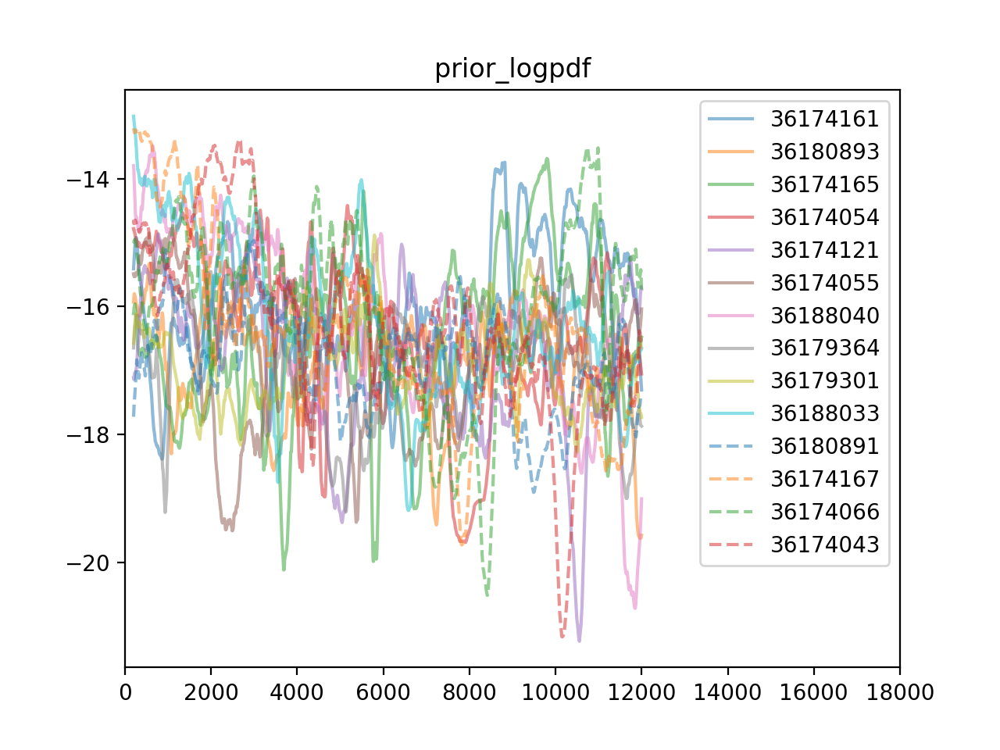

In [15]:
fig = plt.figure()
for i,arr in enumerate(debug[:10]):
    plt.plot(arr['prior_logpdf'].rolling(window=200).mean(),alpha=.5,label=arr.iloc[0]['chain_id'])
for i,arr in enumerate(debug[10:]):
    plt.plot(arr['prior_logpdf'].rolling(window=200).mean(),'--',alpha=.5,label=arr.iloc[0]['chain_id'])
    
plt.xlim(0,18000)

plt.legend()
plt.title('prior_logpdf')
plt.show()

<IPython.core.display.Javascript object>


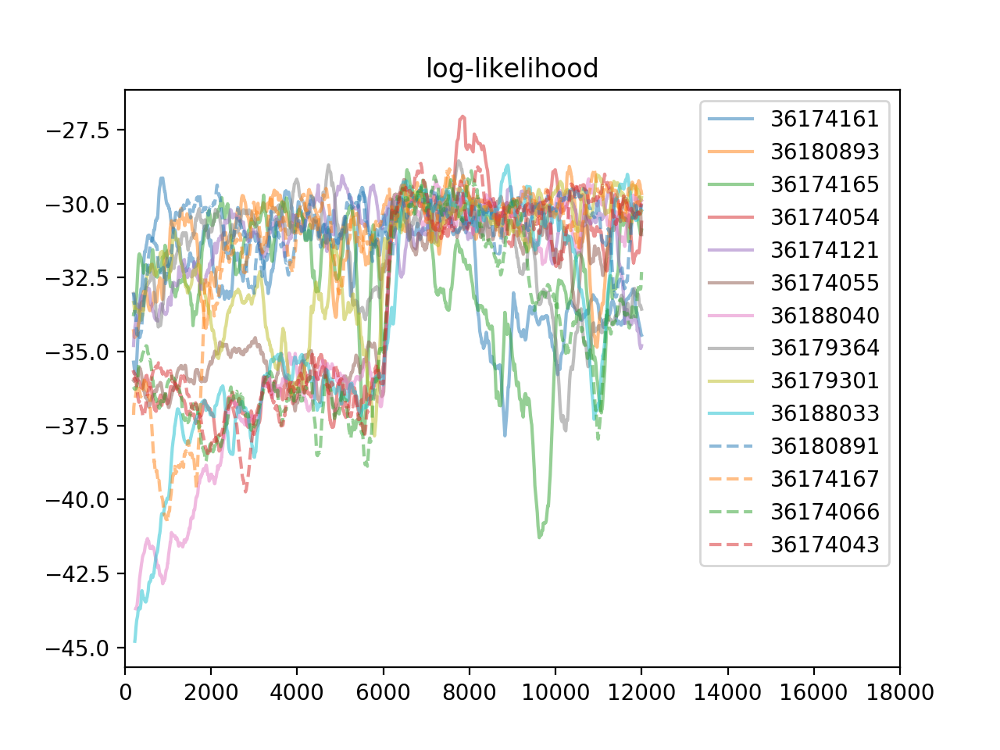

In [16]:
fig = plt.figure()
for i,arr in enumerate(debug[:10]):
    plt.plot(arr['llh'].rolling(window=200).mean(),alpha=.5,label=arr.iloc[0]['chain_id'])
for i,arr in enumerate(debug[10:]):
    plt.plot(arr['llh'].rolling(window=200).mean(),'--',alpha=.5,label=arr.iloc[0]['chain_id'])
    
plt.xlim(0,18000)

plt.legend()
plt.title('log-likelihood')
plt.show()

<IPython.core.display.Javascript object>


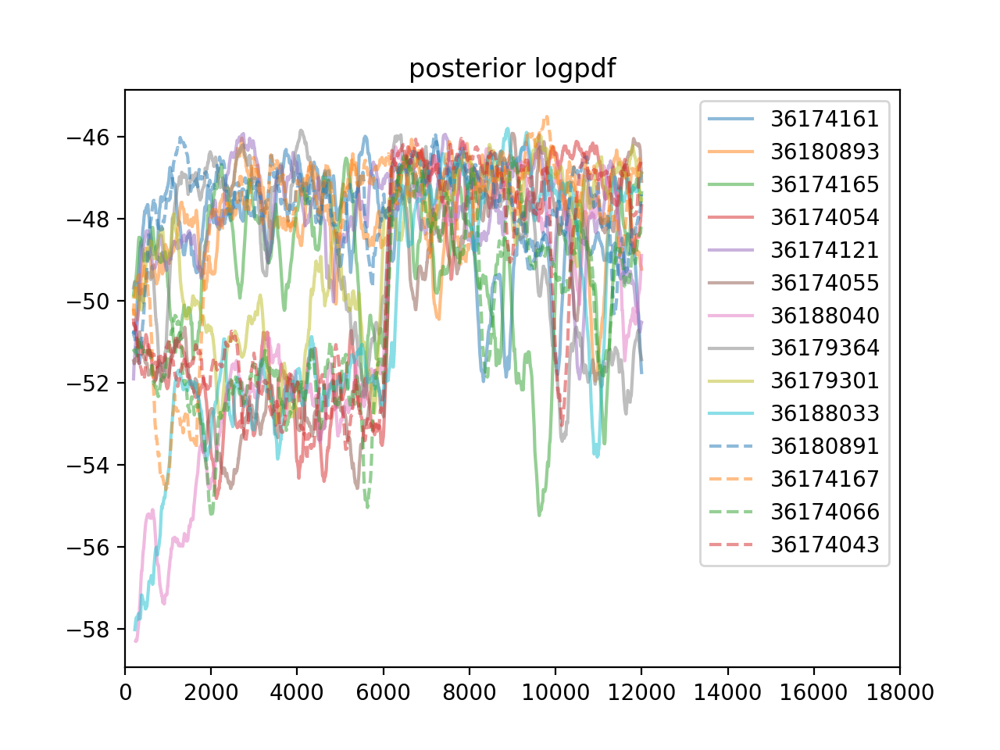

In [17]:
fig = plt.figure()
for i,arr in enumerate(debug[:10]):
    plt.plot(arr['posterior_logpdf'].rolling(window=200).mean(),alpha=.5,label=arr.iloc[0]['chain_id'])
for i,arr in enumerate(debug[10:]):
    plt.plot(arr['posterior_logpdf'].rolling(window=200).mean(),'--',alpha=.5,label=arr.iloc[0]['chain_id'])
    
plt.xlim(0,18000)

plt.legend()
plt.title('posterior logpdf')
plt.show()

<IPython.core.display.Javascript object>


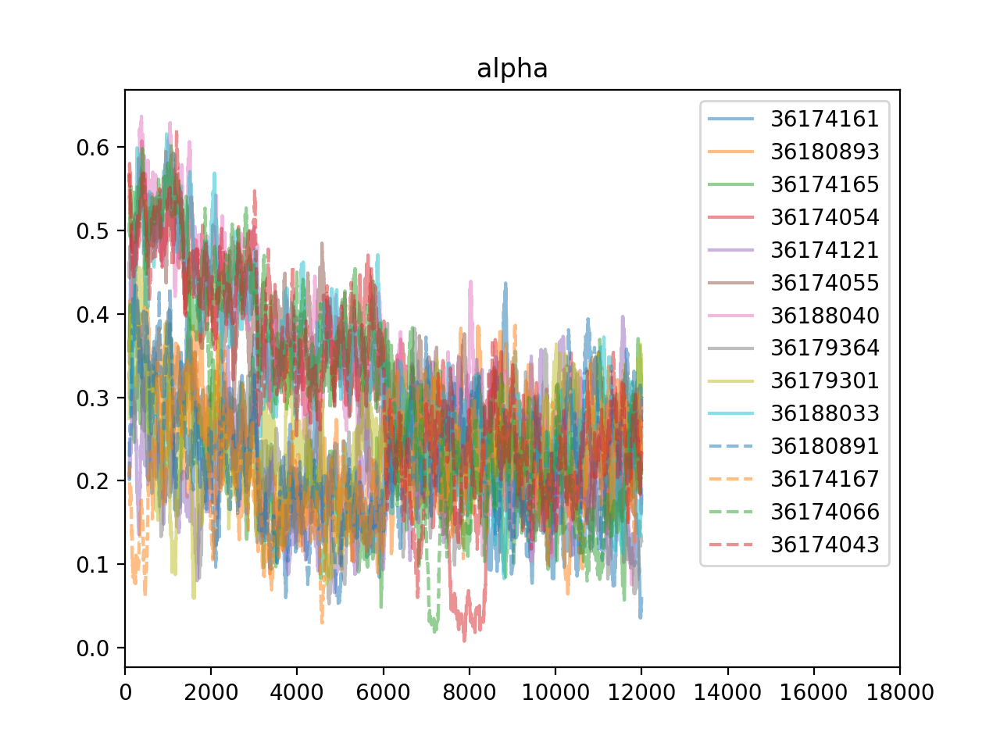

In [18]:
fig = plt.figure()
for i,arr in enumerate(debug[:10]):
    plt.plot(pd.Series(np.minimum(1,arr['alpha'])).rolling(window=100).mean(),alpha=.5,label=arr.iloc[0]['chain_id'])
for i,arr in enumerate(debug[10:]):
    plt.plot(pd.Series(np.minimum(1,arr['alpha'])).rolling(window=100).mean(),'--',alpha=.5,label=arr.iloc[0]['chain_id'])
    
plt.xlim(0,18000)

plt.legend()
plt.title('alpha')
plt.show()

In [23]:
from prior import LatLonPrior

model_bounds = {'lat_min':-10,'lat_max':-2,'lon_min':126,'lon_max':133.5}

# Banda Arc fault object
arrays = np.load('slab2_banda.npz')
fault = tb.GridFault(bounds=model_bounds,**arrays)

# Priors
# latitude/longitude
depth_mu = 30000
depth_std = 5000
mindepth = 2500
maxdepth = 50000
a,b = (mindepth - depth_mu) / depth_std, (maxdepth - depth_mu) / depth_std
depth_dist = stats.truncnorm(a,b,loc=depth_mu,scale=depth_std)
latlon_prior = LatLonPrior(fault,depth_dist)

# magnitude
mag_prior = stats.truncexpon(b=3,loc=6.5)

# delta_logl
delta_logl_prior = stats.norm(scale=.188) # sample standard deviation from data

# delta_logw
delta_logw_prior = stats.norm(scale=.172) # sample standard deviation from data

# depth offset
depth_offset_prior = stats.norm(scale=5) # in km to avoid numerically singular covariance matrix

<IPython.core.display.Javascript object>


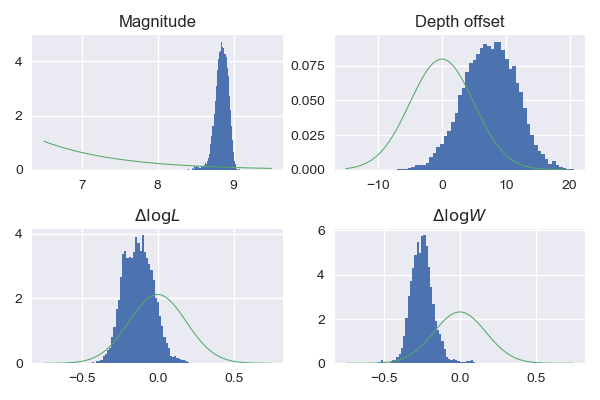

In [24]:
fig = plt.figure(figsize=(6,4))

plt.subplot(2,2,1)
plt.hist(all_samples['magnitude'],density=True,bins=50)
x = np.linspace(6.5,9.5,100)
plt.plot(x,mag_prior.pdf(x),linewidth=.75)
plt.title('Magnitude')

plt.subplot(2,2,2)
plt.hist(all_samples['depth_offset'],density=True,bins=50)
x = np.linspace(-15,20,100)
plt.plot(x,depth_offset_prior.pdf(x),linewidth=.75)
plt.title('Depth offset')

plt.subplot(2,2,3)
plt.hist(all_samples['delta_logl'],density=True,bins=50)
x = np.linspace(-.75,.75,100)
plt.plot(x,delta_logl_prior.pdf(x),linewidth=.75)
plt.title('$\Delta \log L$')

plt.subplot(2,2,4)
plt.hist(all_samples['delta_logw'],density=True,bins=50)
x = np.linspace(-.75,.75,100)
plt.plot(x,delta_logw_prior.pdf(x),linewidth=.75)
plt.title('$\Delta \log W$')

plt.tight_layout()
plt.savefig('plots/posterior_vs_prior.pdf')

In [26]:
lat = np.linspace(-8,-1,300)
lon = np.linspace(127,133,300)
Lat,Lon = np.meshgrid(lat,lon)
Depth = fault.depth_map(Lat,Lon)
logpdf = depth_dist.logpdf(Depth)

/Users/hringer/opt/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:899: RuntimeWarning: invalid value encountered in less_equal
  return (a <= x) & (x <= b)


<IPython.core.display.Javascript object>


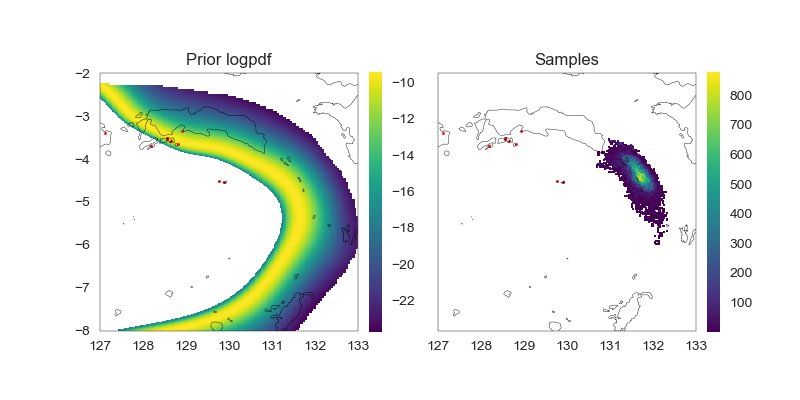

In [27]:
fig = plt.figure(figsize=(8,4))

ax = plt.subplot(1,2,1,projection=crs)
ax.set_extent((127,133,-8,-2))
ax.coastlines(resolution='10m')
plt.xticks(np.arange(127,134))
plt.yticks(np.arange(-8,-1))
plt.pcolormesh(Lon,Lat,logpdf.T,cmap='viridis')
plt.colorbar(fraction=0.046, pad=0.04)
plt.scatter(obs_loc[:,0],obs_loc[:,1],s=3,c='r')
plt.title('Prior logpdf')
# for loc,name in zip(name_loc,obs_names):
#     plt.annotate(name,loc+.01)
# plt.plot(np.linspace(128.5,obs_loc[4,0],100),np.linspace(-4,obs_loc[4,1],100),color='k',linewidth=.3)


ax = plt.subplot(1,2,2,projection=crs)
ax.set_extent((127,133,-8,-2))
ax.coastlines(resolution='10m')
plt.xticks(np.arange(127,134))
plt.hist2d(all_samples['longitude'],all_samples['latitude'],cmap='viridis',bins=200,range=[[127,133],[-8,-2]],cmin=1)
plt.colorbar(fraction=0.046, pad=0.04)
plt.scatter(obs_loc[:,0],obs_loc[:,1],s=3,c='r')
plt.title('Samples')
# plt.title("Sample Density")
plt.savefig('plots/latlonprior_vs_samples.pdf')

<IPython.core.display.Javascript object>


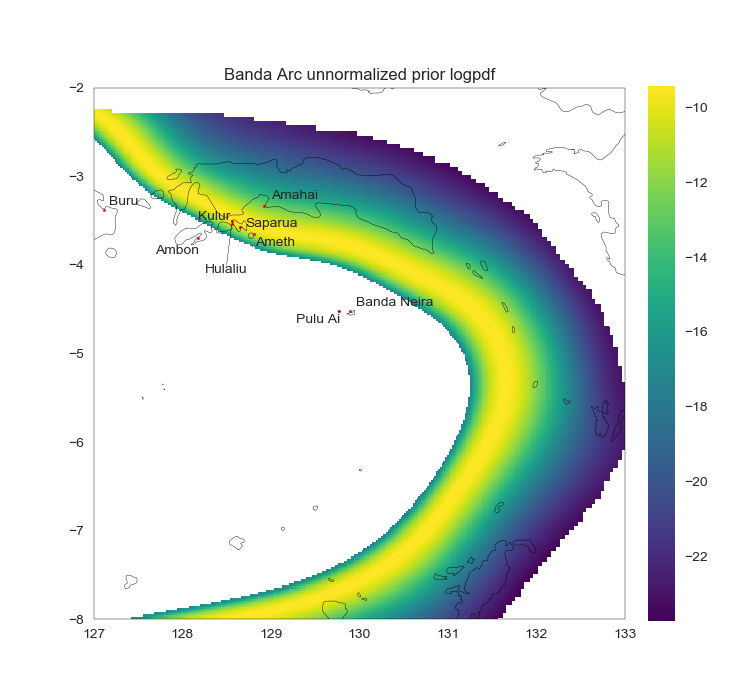

In [28]:
fig = plt.figure(figsize=(7.5,7))

ax = plt.axes(projection=crs)
ax.set_extent((127,133,-8,-2))
ax.coastlines(resolution='10m')
plt.xticks(np.arange(127,134))
plt.yticks(np.arange(-8,-1))
plt.pcolormesh(Lon,Lat,logpdf.T,cmap='viridis')
plt.colorbar(fraction=0.046, pad=0.04)
plt.scatter(obs_loc[:,0],obs_loc[:,1],s=3,c='r')
for loc,name in zip(name_loc,obs_names):
    plt.annotate(name,loc+.01)
plt.plot(np.linspace(128.5,obs_loc[4,0],100),np.linspace(-4,obs_loc[4,1],100),color='k',linewidth=.3)
plt.title('Banda Arc unnormalized prior logpdf')
plt.savefig('plots/bandaarc_prior.pdf')

<IPython.core.display.Javascript object>


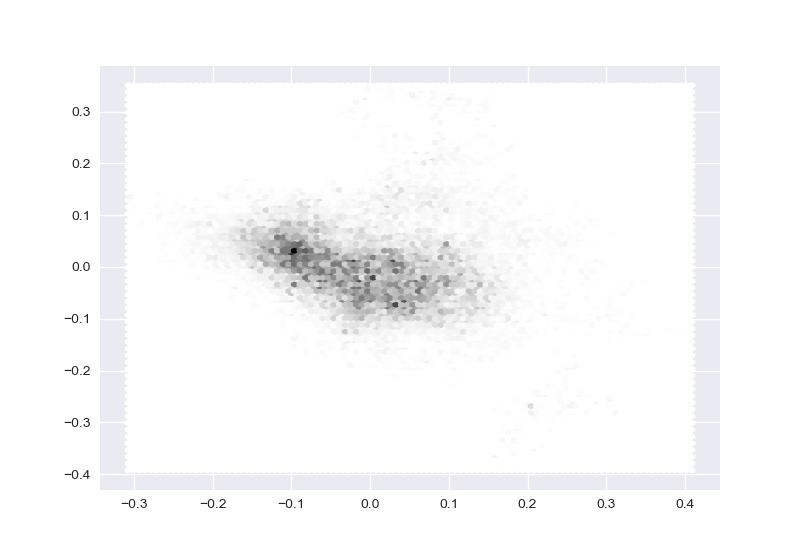

In [323]:
fig = plt.figure()
plt.hexbin(all_samples['delta_logl']-all_samples['delta_logl'].mean(),
           all_samples['delta_logw']-all_samples['delta_logw'].mean())
plt.show()

<IPython.core.display.Javascript object>


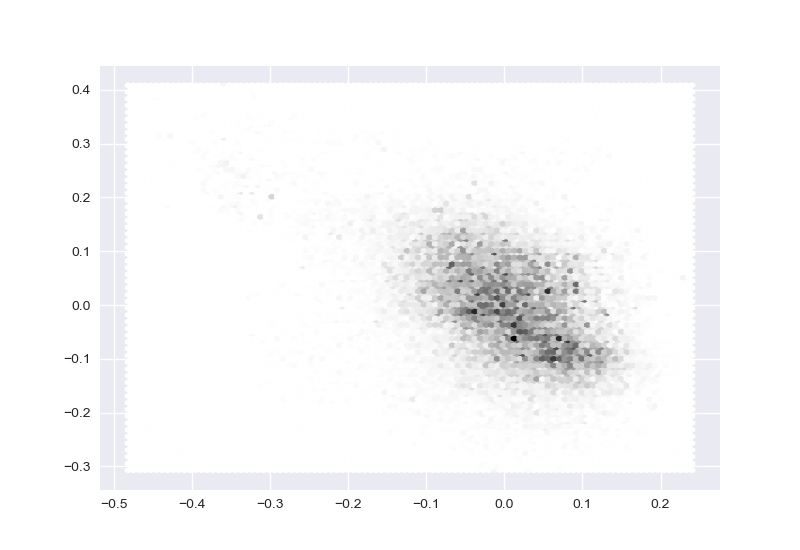

In [325]:
fig = plt.figure()
plt.hexbin(all_samples['magnitude']-all_samples['magnitude'].mean(),
           all_samples['delta_logl']-all_samples['delta_logl'].mean())
plt.show()

In [326]:
all_samples.corr()

,latitude,longitude,magnitude,delta_logl,delta_logw,depth_offset
latitude,1.000000,-0.685792,0.274875,-0.708943,0.185721,0.239894
longitude,-0.685792,1.000000,0.266471,0.450274,0.036100,0.128741
magnitude,0.274875,0.266471,1.000000,-0.439527,0.671881,0.332878
delta_logl,-0.708943,0.450274,-0.439527,1.000000,-0.258474,-0.213145
delta_logw,0.185721,0.036100,0.671881,-0.258474,1.000000,0.153411
depth_offset,0.239894,0.128741,0.332878,-0.213145,0.153411,1.000000


<IPython.core.display.Javascript object>


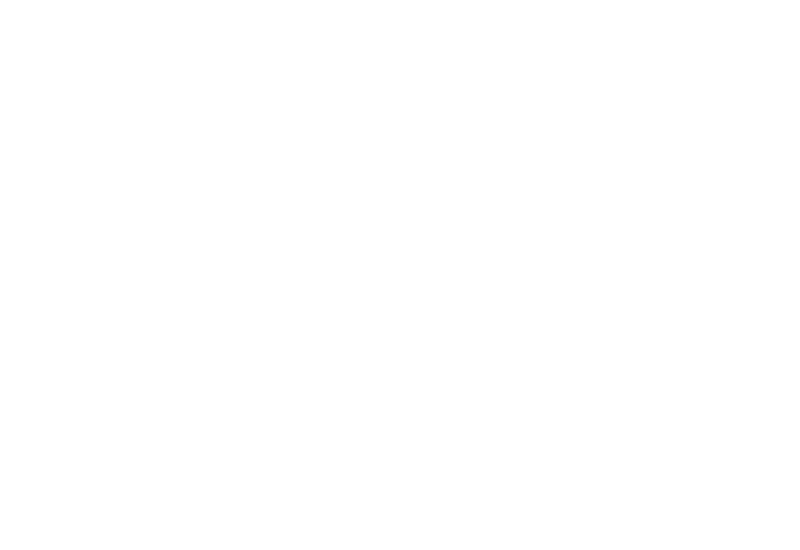

<IPython.core.display.Javascript object>


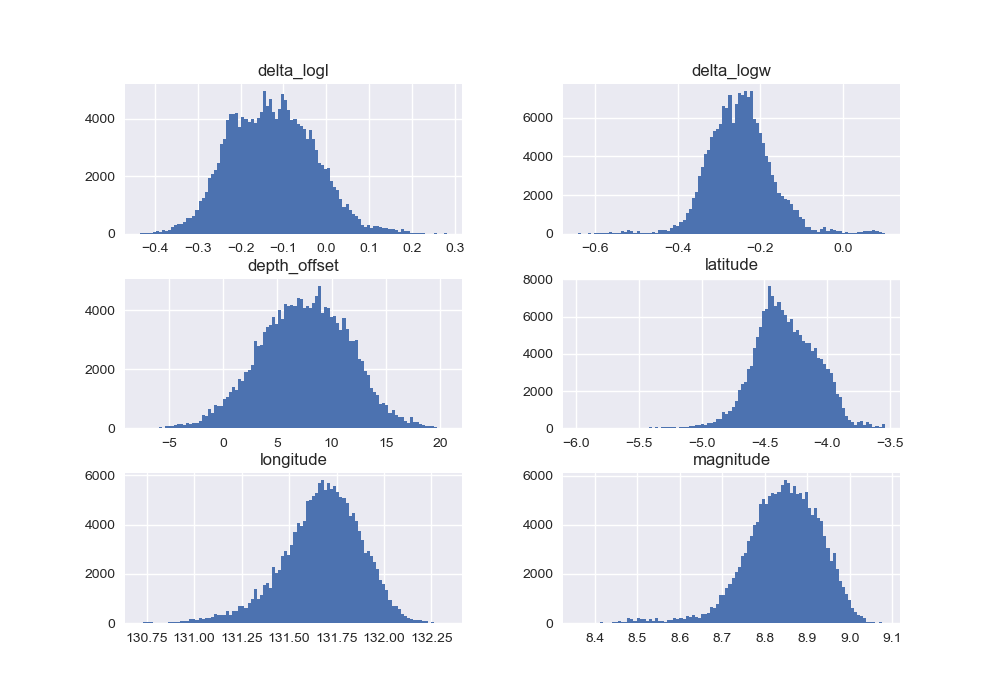

In [247]:
fig = plt.figure()
all_samples.hist(bins=100,figsize=(10,7))
plt.show()

<IPython.core.display.Javascript object>


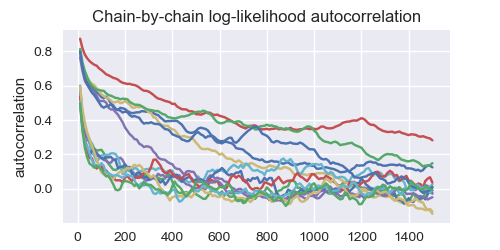

In [9]:
fig = plt.figure(figsize=(5,2.5))
[plt.plot(10*np.arange(1,151),[(-df['llh']).autocorr(k) for k in 10*np.arange(1,151)]) for df in bayes_data]
# plt.ylim(0,1)
plt.title('Chain-by-chain log-likelihood autocorrelation')
plt.ylabel('autocorrelation')
plt.xlabel('lags')
plt.savefig('plots/autocorrelation.pdf')

<IPython.core.display.Javascript object>


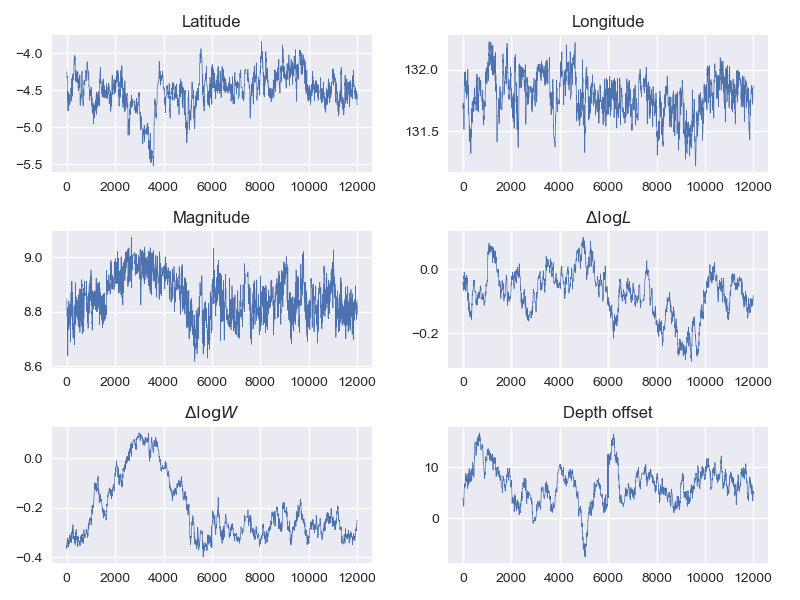

In [10]:
plt.style.use('seaborn')
fig = plt.figure(figsize=(8,6))
plt.subplot(3,2,1)
plt.plot(samples[2]['latitude'],linewidth=.5)
plt.title('Latitude')
plt.subplot(3,2,2)
plt.plot(samples[2]['longitude'],linewidth=.5)
plt.title('Longitude')
plt.subplot(3,2,3)
plt.plot(samples[2]['magnitude'],linewidth=.5)
plt.title('Magnitude')
plt.subplot(3,2,4)
plt.plot(samples[2]['delta_logl'],linewidth=.5)
plt.title('$\Delta \log L$')
plt.subplot(3,2,5)
plt.plot(samples[2]['delta_logw'],linewidth=.5)
plt.title('$\Delta \log W$')
plt.subplot(3,2,6)
plt.plot(samples[2]['depth_offset'],linewidth=.5)
plt.title('Depth offset')
plt.tight_layout()
plt.savefig('plots/chain2series.pdf')

In [18]:
df = pd.read_csv('../../../slab2/1219database/ALL_EQ_121819.csv',low_memory=False)

banda = df.loc[(df.lon>=127)&(df.lon<=134)&(df.lat>=-10)&(df.lat<=-2)]

banda_kde = gaussian_kde(np.array([banda.lat,banda.lon]))

lon = np.linspace(127,134,400)
lat = np.linspace(-10,-2,400)
Lat,Lon = np.meshgrid(lat,lon)

In [19]:
pdf = banda_kde.pdf(np.array([Lat.flatten(),Lon.flatten()])).reshape(Lat.shape)

<IPython.core.display.Javascript object>


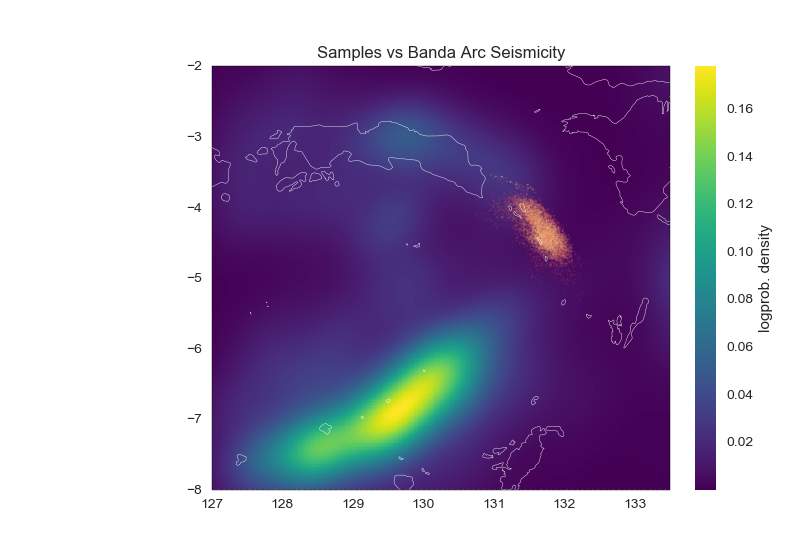

In [22]:
fig = plt.figure()
ax = plt.axes(projection=crs)
ax.set_extent((127,133.5,-8,-2))
ax.coastlines(resolution='10m',color='white')
plt.pcolormesh(Lon,Lat,pdf, cmap='viridis')
# CS = plt.contour(X,Y,avgdtopo,levels=np.linspace(-2,2,51))
# plt.clabel(CS)
plt.colorbar(label='logprob. density',fraction=0.04, pad=0.04)
plt.scatter(all_samples.loc[::20,'longitude'],
            all_samples.loc[::20,'latitude'],
            c=all_bayes_data.loc[::20,'posterior_logpdf'],cmap='magma',s=1,alpha=.1)
plt.xticks(np.arange(127,134))
plt.yticks(np.arange(-8,-1))
# plt.legend()
plt.title('Samples vs Banda Arc Seismicity')
plt.savefig('plots/seismic_gap.pdf')

# KDE stuff

In [12]:
from scipy.stats import gaussian_kde


In [149]:
lat = np.linspace(-6,-3,25)
lon = np.linspace(130,133,25)
Lat,Lon = np.meshgrid(lat,lon)

In [150]:
lats = np.array(all_samples['latitude'])
lons = np.array(all_samples['longitude'])

In [151]:
counts = (np.less_equal.outer(Lat,lats)&
np.greater_equal.outer(np.roll(Lat,-1,axis=1),lats)&
np.less_equal.outer(Lon,lons)&
np.greater_equal.outer(np.roll(Lon,-1,axis=0),lons)).sum(axis=-1)
_filter = (counts > 0).astype(int)

In [89]:
pdf = latlon_kde.pdf(np.array([Lat.flatten(),Lon.flatten()])).reshape(Lat.shape)

<IPython.core.display.Javascript object>


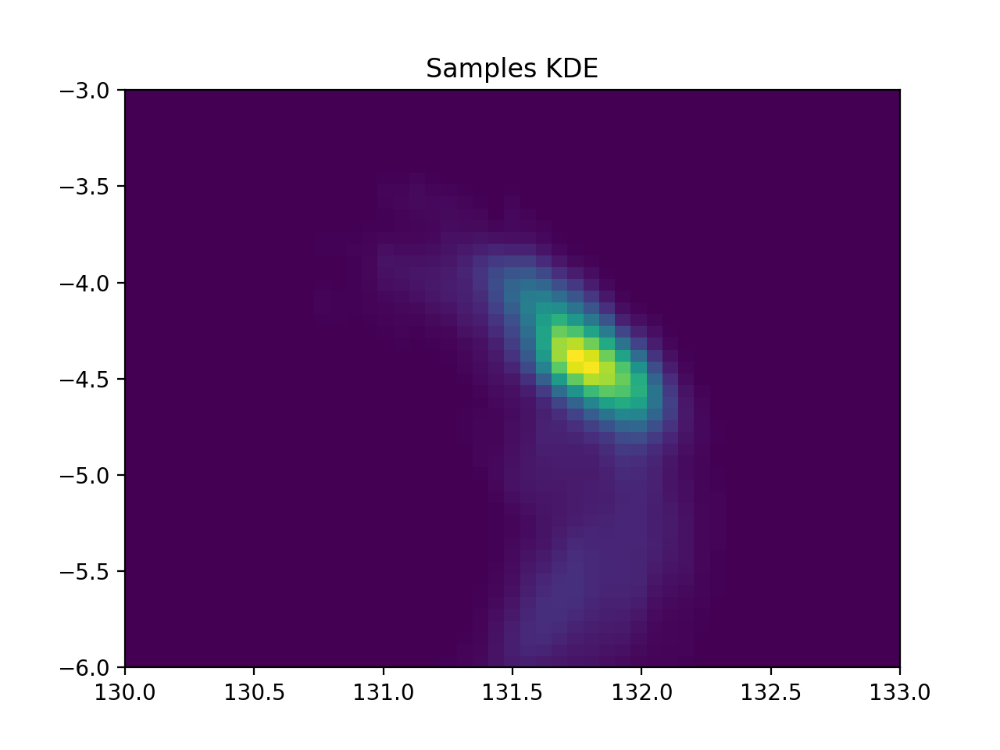

In [91]:
fig = plt.figure()
plt.pcolormesh(Lon,Lat,pdf)
plt.title("Samples KDE")
plt.show()

In [92]:
latlonmag_kde = gaussian_kde(np.array(all_samples[['latitude','longitude','magnitude']]).T)

In [152]:
mag = np.linspace(8.4,9,10)
Lat,Lon,Mag = np.meshgrid(lat,lon,mag)

In [98]:
pdf = latlonmag_kde.pdf(np.array([Lat.flatten(),Lon.flatten(),Mag.flatten()])).reshape(Lat.shape)

In [153]:
condexp = ((pdf*mag).sum(axis=2))/pdf.sum(axis=2)

In [155]:
_filter*condexp

array([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.

<IPython.core.display.Javascript object>


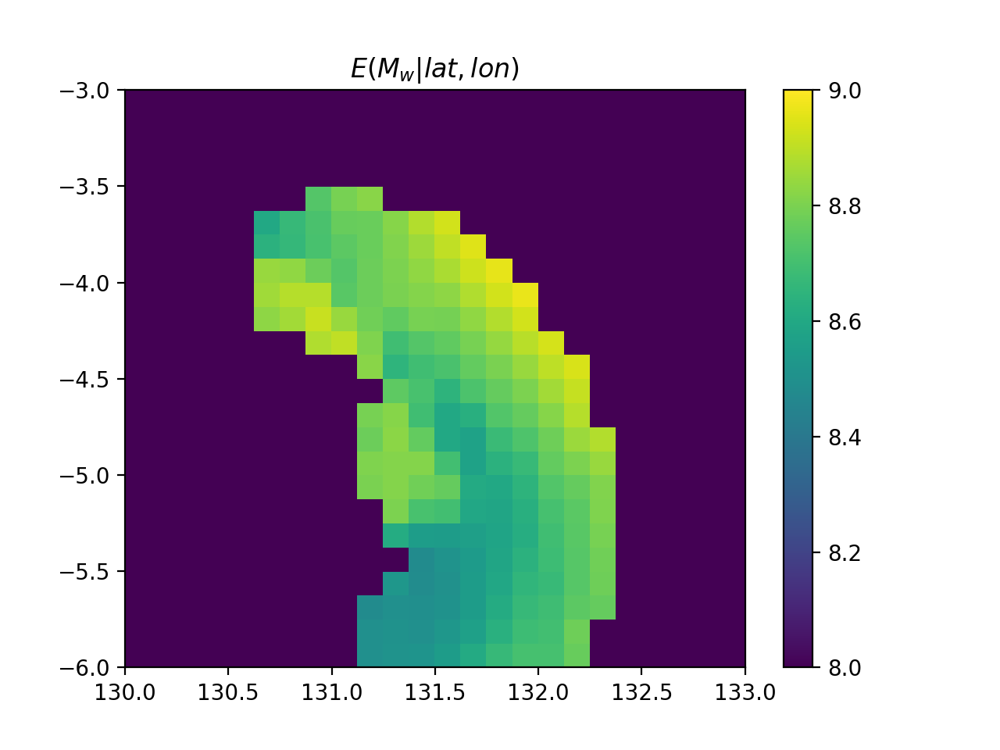

In [157]:
fig = plt.figure()
plt.pcolormesh(Lon[...,0],Lat[...,0],_filter*condexp,vmin=8,vmax=9)
plt.colorbar()
# plt.scatter(lons,lats,c='r',s=1,alpha=.01)
plt.title("$E(M_w|lat,lon)$")
plt.show()

<IPython.core.display.Javascript object>


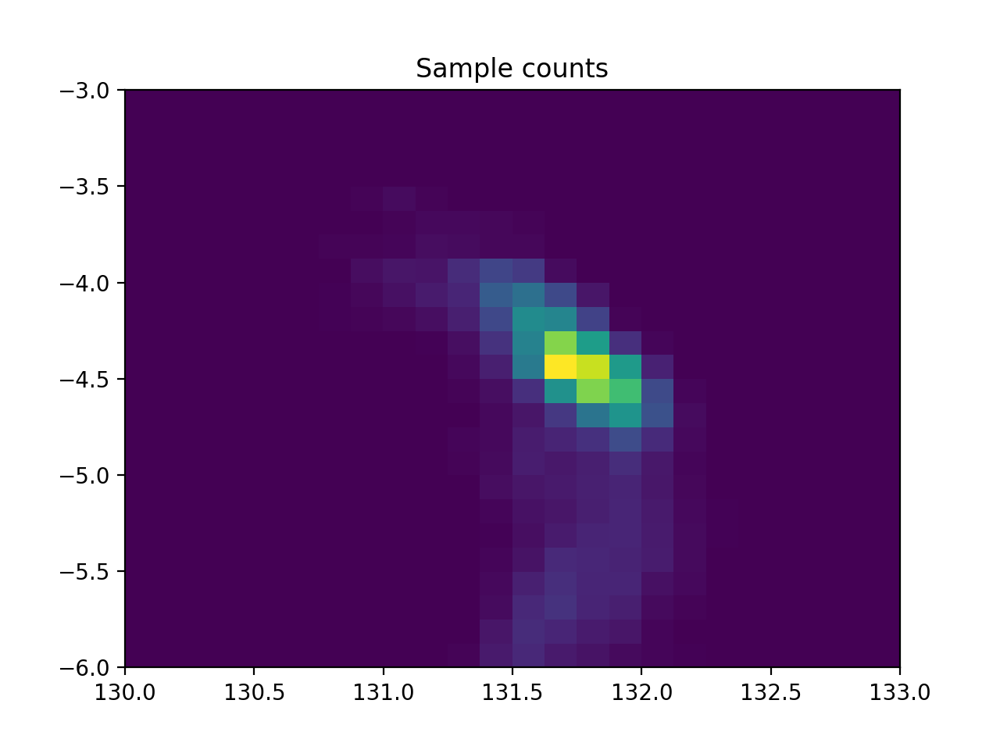

In [139]:
fig = plt.figure()
plt.pcolormesh(Lon,Lat,counts)
plt.title("Sample counts")
plt.show()

In [131]:
np.greater_equal.outer(lat,lats).sum(axis=-1)

array([  4152,   7470,  11509,  16283,  21087,  25632,  29564,  33342,
        37405,  41778,  48572,  62020,  84802, 113645, 133863, 148097,
       159123, 165499, 166798, 167567, 168000, 168000, 168000, 168000,
       168000])

In [115]:
np.roll?

In [118]:
np.roll(Lat,-1,axis=1)

array([[-5.875, -5.75 , -5.625, -5.5  , -5.375, -5.25 , -5.125, -5.   ,
        -4.875, -4.75 , -4.625, -4.5  , -4.375, -4.25 , -4.125, -4.   ,
        -3.875, -3.75 , -3.625, -3.5  , -3.375, -3.25 , -3.125, -3.   ,
        -6.   ],
       [-5.875, -5.75 , -5.625, -5.5  , -5.375, -5.25 , -5.125, -5.   ,
        -4.875, -4.75 , -4.625, -4.5  , -4.375, -4.25 , -4.125, -4.   ,
        -3.875, -3.75 , -3.625, -3.5  , -3.375, -3.25 , -3.125, -3.   ,
        -6.   ],
       [-5.875, -5.75 , -5.625, -5.5  , -5.375, -5.25 , -5.125, -5.   ,
        -4.875, -4.75 , -4.625, -4.5  , -4.375, -4.25 , -4.125, -4.   ,
        -3.875, -3.75 , -3.625, -3.5  , -3.375, -3.25 , -3.125, -3.   ,
        -6.   ],
       [-5.875, -5.75 , -5.625, -5.5  , -5.375, -5.25 , -5.125, -5.   ,
        -4.875, -4.75 , -4.625, -4.5  , -4.375, -4.25 , -4.125, -4.   ,
        -3.875, -3.75 , -3.625, -3.5  , -3.375, -3.25 , -3.125, -3.   ,
        -6.   ],
       [-5.875, -5.75 , -5.625, -5.5  , -5.375, -5.25 , -5.125, -5. 

In [22]:
[df['acceptance_rate'].iloc[-1] for df in debug], np.mean([df['acceptance_rate'].iloc[-1] for df in debug])

([0.2143690615102517,
  0.23887314552425404,
  0.21553592265377566,
  0.312968828138023,
  0.2143690615102517,
  0.32688781463577266,
  0.3214702450408401,
  0.2282047007834639,
  0.2449574929154859,
  0.3258876479413236,
  0.2291215202533756,
  0.2154525754292382,
  0.3128854809134856,
  0.3168861476912819],
 0.26556211749577313)

In [23]:
[df.iloc[6000:]['accepted'].sum()/len(df.iloc[6000:]) for df in debug]

[0.1952317439146382,
 0.2375791930643548,
 0.21623874624874959,
 0.21057019006335445,
 0.2429143047682561,
 0.24674891630543513,
 0.23207735911970656,
 0.217405801933978,
 0.2579193064354785,
 0.24124708236078693,
 0.2375791930643548,
 0.23524508169389796,
 0.2025675225075025,
 0.22324108036012005]

<IPython.core.display.Javascript object>


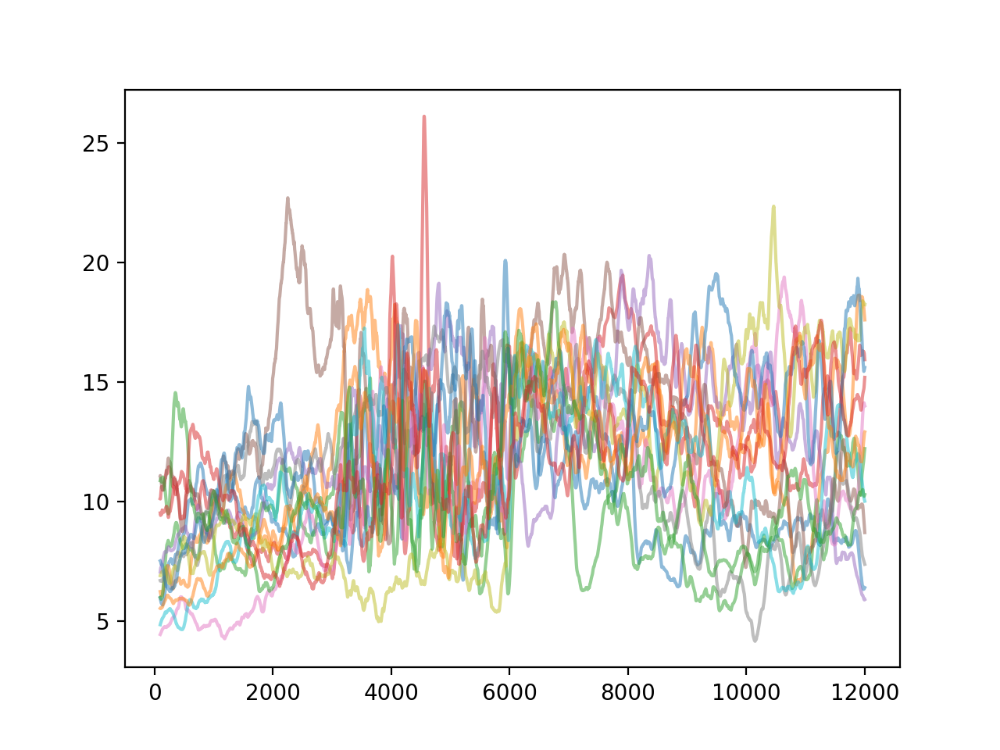

In [24]:
fig = plt.figure()
for df in model_params:
    plt.plot(df['slip'].rolling(window=100).mean(),alpha=.5)
plt.show()

In [16]:
northern_ids = [36174161,36180893,36174165,36174121,36179364,36179301,36180891,36174167]
northern_ids = [str(x) for x in northern_ids]
southern_ids = [36174054,36174055,36188040,36188033,36174066,36174043,36213780]
southern_ids = [str(x) for x in southern_ids]
northern_samples = [df for df in samples if df['chain_id'].iloc[0] in northern_ids]
southern_samples = [df for df in samples if df['chain_id'].iloc[0] in southern_ids]

In [17]:
northern_model_params = [df for df in model_params if df['chain_id'].iloc[0] in northern_ids]
southern_model_params = [df for df in model_params if df['chain_id'].iloc[0] in southern_ids]

<IPython.core.display.Javascript object>


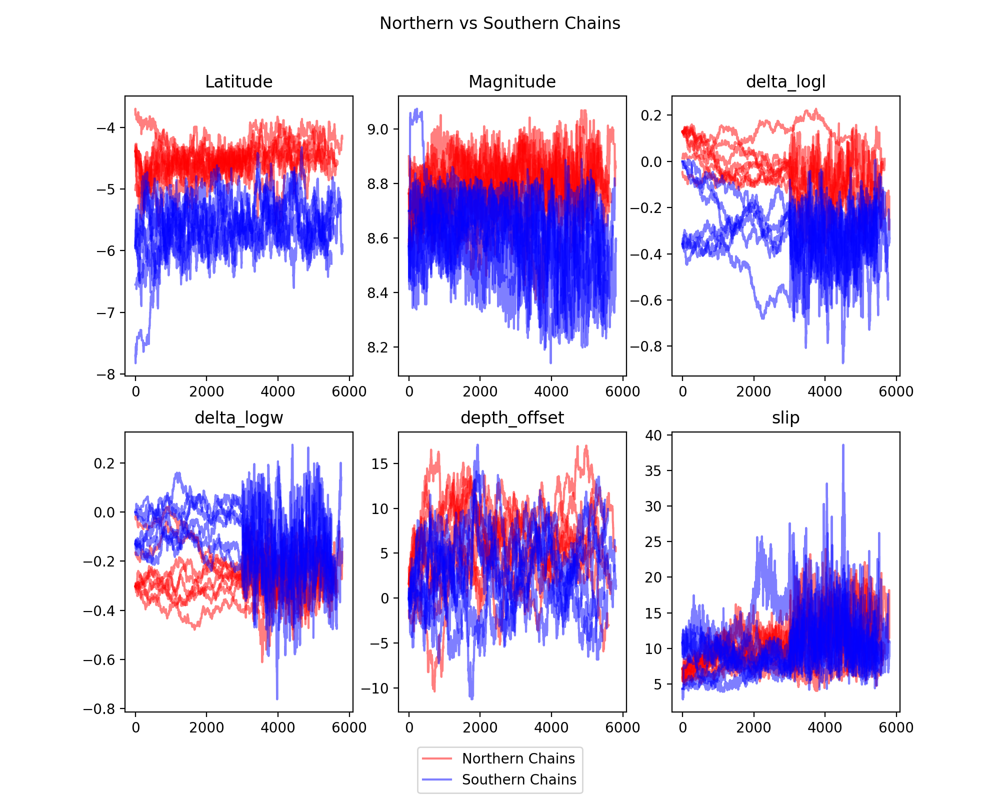

In [50]:
n = 1
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(2,3,1)
i = 0
for df in northern_samples:
    if i==0:
        ax.plot(df['latitude'].rolling(window=n).mean(),c='r',alpha=.5,label='Northern Chains')
    else:
        ax.plot(df['latitude'].rolling(window=n).mean(),c='r',alpha=.5)
    i += 1
    
i = 0
for df in southern_samples:
    if i ==0:
        ax.plot(df['latitude'].rolling(window=n).mean(),c='b',alpha=.5,label='Southern Chains')
    else:
        ax.plot(df['latitude'].rolling(window=n).mean(),c='b',alpha=.5)
    i += 1

plt.title('Latitude')
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center')

plt.subplot(2,3,2)
for df in northern_samples:
    plt.plot(df['magnitude'].rolling(window=n).mean(),c='r',alpha=.5)
for df in southern_samples:
    plt.plot(df['magnitude'].rolling(window=n).mean(),c='b',alpha=.5)
plt.title('Magnitude')
plt.subplot(2,3,3)
for df in northern_samples:
    plt.plot(df['delta_logl'].rolling(window=n).mean(),c='r',alpha=.5)
for df in southern_samples:
    plt.plot(df['delta_logl'].rolling(window=n).mean(),c='b',alpha=.5)
plt.title('delta_logl')
plt.subplot(2,3,4)
for df in northern_samples:
    plt.plot(df['delta_logw'].rolling(window=n).mean(),c='r',alpha=.5)
for df in southern_samples:
    plt.plot(df['delta_logw'].rolling(window=n).mean(),c='b',alpha=.5)
plt.title('delta_logw')
plt.subplot(2,3,5)
for df in northern_samples:
    plt.plot(df['depth_offset'].rolling(window=n).mean(),c='r',alpha=.5)
for df in southern_samples:
    plt.plot(df['depth_offset'].rolling(window=n).mean(),c='b',alpha=.5)
plt.title('depth_offset')
plt.subplot(2,3,6)
for df in northern_model_params:
    plt.plot(df['slip'].rolling(window=n).mean(),c='r',alpha=.5)
for df in southern_model_params:
    plt.plot(df['slip'].rolling(window=n).mean(),c='b',alpha=.5)
plt.title('slip')
fig.suptitle("Northern vs Southern Chains")
plt.savefig("n_vs_s_overall.pdf")

In [35]:
from mpl_toolkits.mplot3d import Axes3D

In [18]:
northern_debug = [df for df in debug if df['chain_id'].iloc[0] in northern_ids]
southern_debug = [df for df in debug if df['chain_id'].iloc[0] in southern_ids]

In [19]:
n_debug = pd.concat(northern_debug,ignore_index=True)
s_debug = pd.concat(southern_debug,ignore_index=True)

In [20]:
n_debug['aspect_ratio'] = n_debug['length']/n_debug['width']
s_debug['aspect_ratio'] = s_debug['length']/s_debug['width']
n_debug['p_aspect_ratio'] = n_debug['p_length']/n_debug['p_width']
s_debug['p_aspect_ratio'] = s_debug['p_length']/s_debug['p_width']

<IPython.core.display.Javascript object>


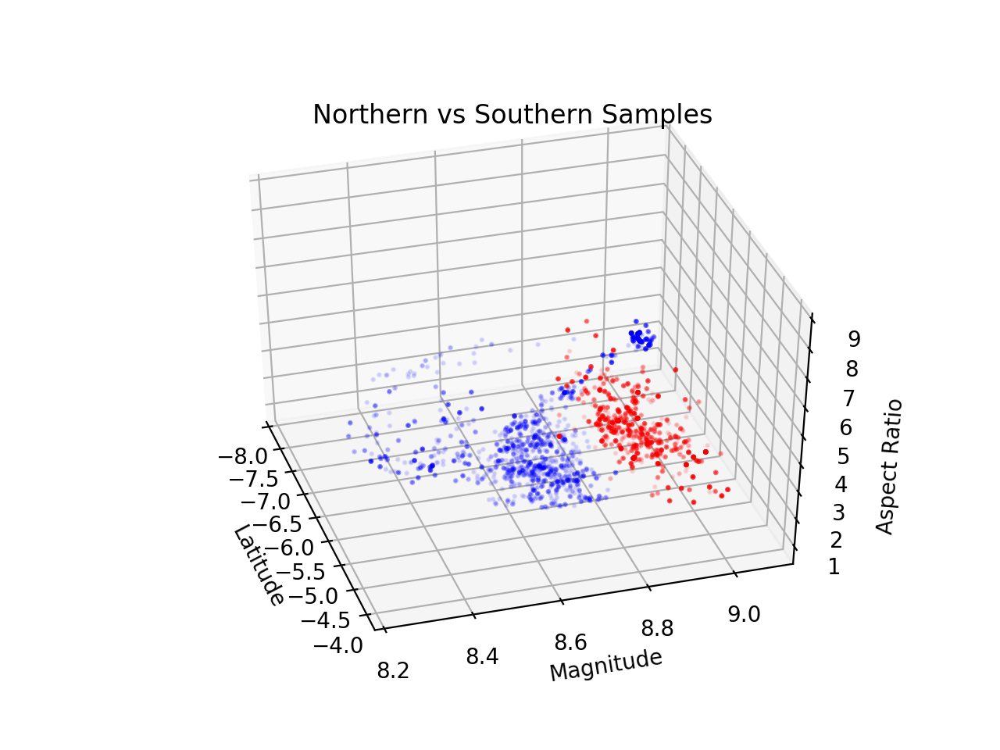

In [40]:
n = 2000
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(n_debug['latitude'].iloc[-n:],n_debug['magnitude'].iloc[-n:],n_debug['aspect_ratio'].iloc[-n:],c='r',s=2,alpha=.1)
ax.scatter(s_debug['latitude'].iloc[-n:],s_debug['magnitude'].iloc[-n:],s_debug['aspect_ratio'].iloc[-n:],c='b',s=2,alpha=.1)
ax.set_xlabel('Latitude')
ax.set_ylabel('Magnitude')
ax.set_zlabel('Aspect Ratio')
plt.title("Northern vs Southern Samples")
plt.show()

<IPython.core.display.Javascript object>


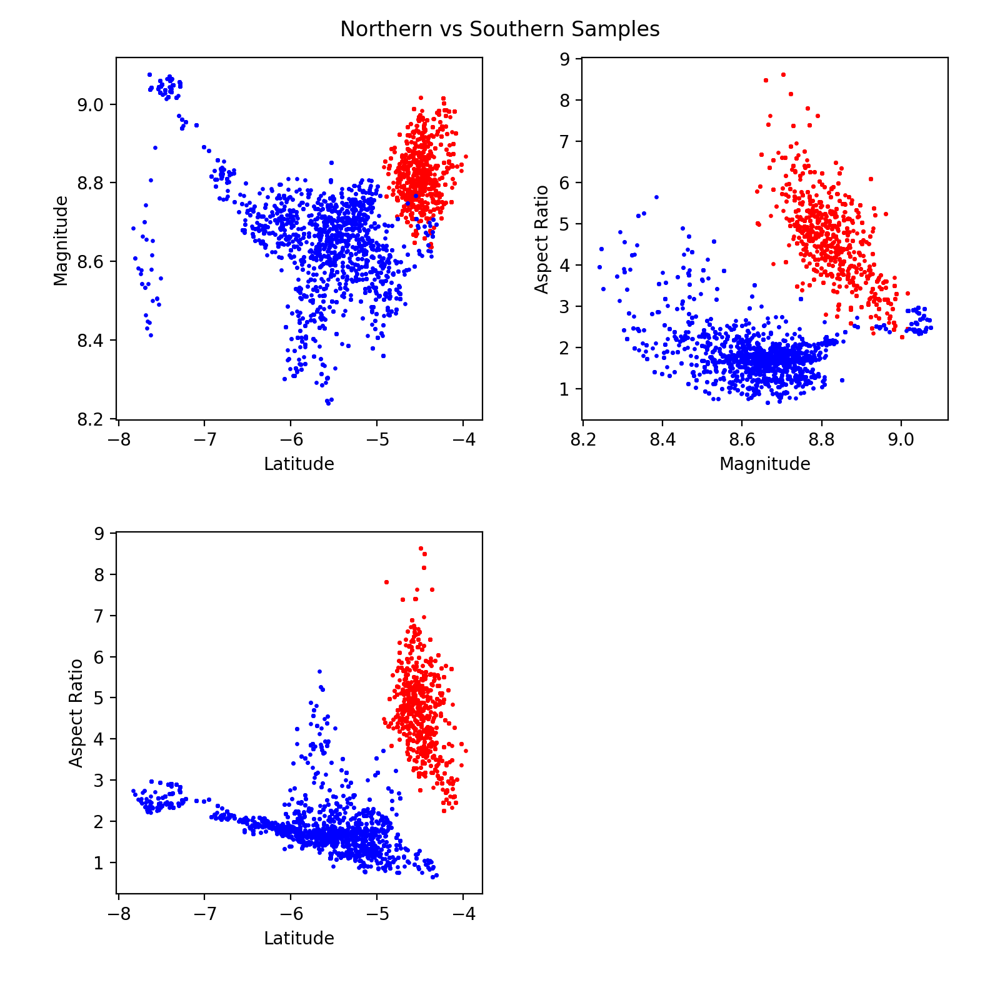

In [61]:
n = 3000
fig = plt.figure(figsize=(8,8))
ax = plt.subplot(2,2,1)
ax.scatter(n_debug['latitude'].iloc[-n:],n_debug['magnitude'].iloc[-n:],c='r',s=2,alpha=1,label='Northern')
ax.scatter(s_debug['latitude'].iloc[-n:],s_debug['magnitude'].iloc[-n:],c='b',s=2,alpha=1,label='Southern')
ax.set_xlabel('Latitude')
ax.set_ylabel('Magnitude')
# plt.title('Latitude vs Magnitude')

ax = plt.subplot(2,2,2)
ax.scatter(n_debug['magnitude'].iloc[-n:],n_debug['aspect_ratio'].iloc[-n:],c='r',s=2,alpha=1)
ax.scatter(s_debug['magnitude'].iloc[-n:],s_debug['aspect_ratio'].iloc[-n:],c='b',s=2,alpha=1)
ax.set_xlabel('Magnitude')
ax.set_ylabel('Aspect Ratio')
# plt.title('Magnitude vs Aspect Ratio')

ax = plt.subplot(2,2,3)
ax.scatter(n_debug['latitude'].iloc[-n:],n_debug['aspect_ratio'].iloc[-n:],c='r',s=2,alpha=1)
ax.scatter(s_debug['latitude'].iloc[-n:],s_debug['aspect_ratio'].iloc[-n:],c='b',s=2,alpha=1)
ax.set_xlabel('Latitude')
ax.set_ylabel('Aspect Ratio')
# plt.title("Latitude vs Aspect Ratio")
fig.suptitle("Northern vs Southern Samples")
plt.tight_layout(pad=3)
plt.savefig("n_vs_s_samples.pdf")

<IPython.core.display.Javascript object>


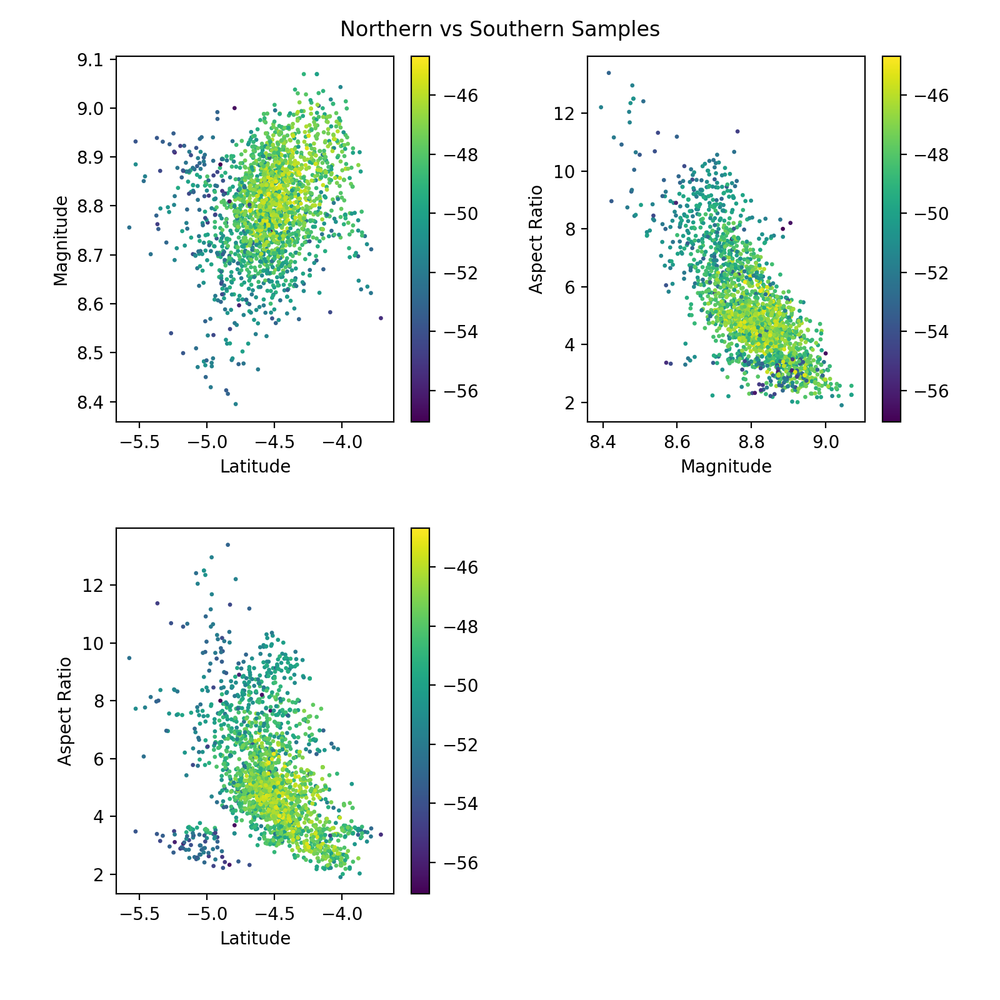

In [25]:
n = 20
fig = plt.figure(figsize=(8,8))
ax = plt.subplot(2,2,1)
plt.scatter(n_debug['latitude'].iloc[::n],n_debug['magnitude'].iloc[::n],c=n_debug['posterior_logpdf'].iloc[::n],s=2,alpha=1,label='Northern')
plt.colorbar()
# ax.scatter(s_debug['latitude'].iloc[-n:],s_debug['magnitude'].iloc[-n:],c='b',s=2,alpha=1,label='Southern')
ax.set_xlabel('Latitude')
ax.set_ylabel('Magnitude')
# plt.title('Latitude vs Magnitude')

ax = plt.subplot(2,2,2)
plt.scatter(n_debug['magnitude'].iloc[::n],n_debug['aspect_ratio'].iloc[::n],c=n_debug['posterior_logpdf'].iloc[::n],s=2,alpha=1)
plt.colorbar()
# ax.scatter(s_debug['magnitude'].iloc[-n:],s_debug['aspect_ratio'].iloc[-n:],c='b',s=2,alpha=1)
ax.set_xlabel('Magnitude')
ax.set_ylabel('Aspect Ratio')
# plt.title('Magnitude vs Aspect Ratio')

ax = plt.subplot(2,2,3)
plt.scatter(n_debug['latitude'].iloc[::n],n_debug['aspect_ratio'].iloc[::n],c=n_debug['posterior_logpdf'].iloc[::n],s=2,alpha=1)
plt.colorbar()
# ax.scatter(s_debug['latitude'].iloc[-n:],s_debug['aspect_ratio'].iloc[-n:],c='b',s=2,alpha=1)
ax.set_xlabel('Latitude')
ax.set_ylabel('Aspect Ratio')
# plt.title("Latitude vs Aspect Ratio")
fig.suptitle("Northern vs Southern Samples")
plt.tight_layout(pad=3)
plt.savefig("n_vs_s_samples.pdf")

<IPython.core.display.Javascript object>


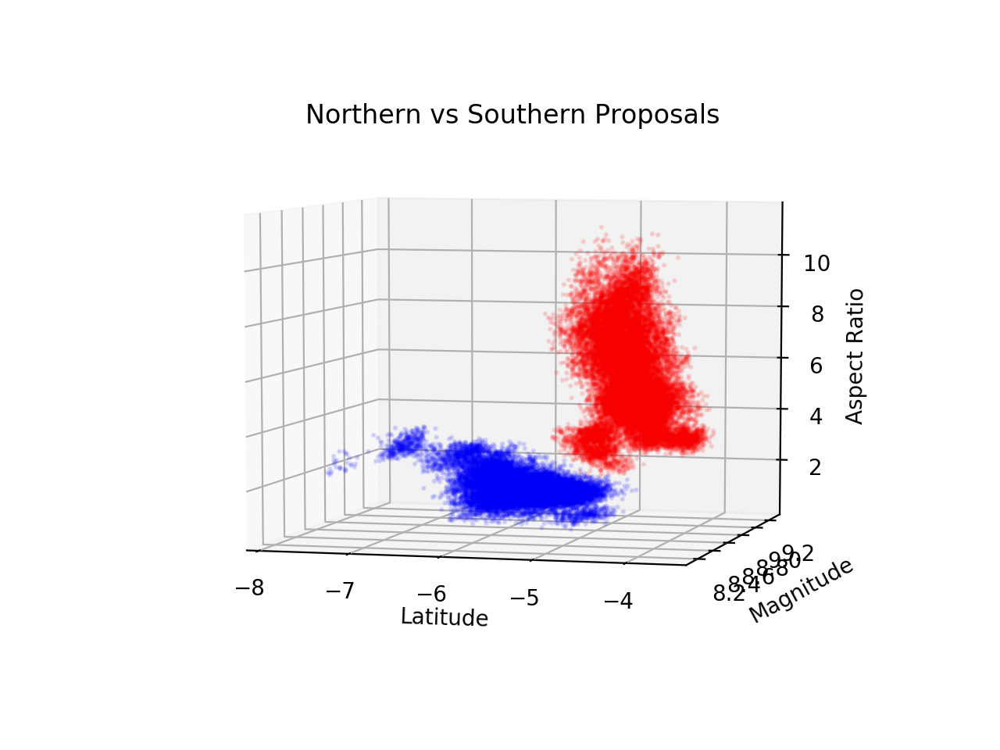

In [39]:
n = 1
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(n_debug['p_latitude'].iloc[::n],n_debug['p_magnitude'].iloc[::n],n_debug['p_aspect_ratio'].iloc[::n],c='r',s=2,alpha=.1)
ax.scatter(s_debug['p_latitude'].iloc[::n],s_debug['p_magnitude'].iloc[::n],s_debug['p_aspect_ratio'].iloc[::n],c='b',s=2,alpha=.1)
ax.set_xlabel('Latitude')
ax.set_ylabel('Magnitude')
ax.set_zlabel('Aspect Ratio')
plt.title("Northern vs Southern Proposals")
plt.show()

<IPython.core.display.Javascript object>


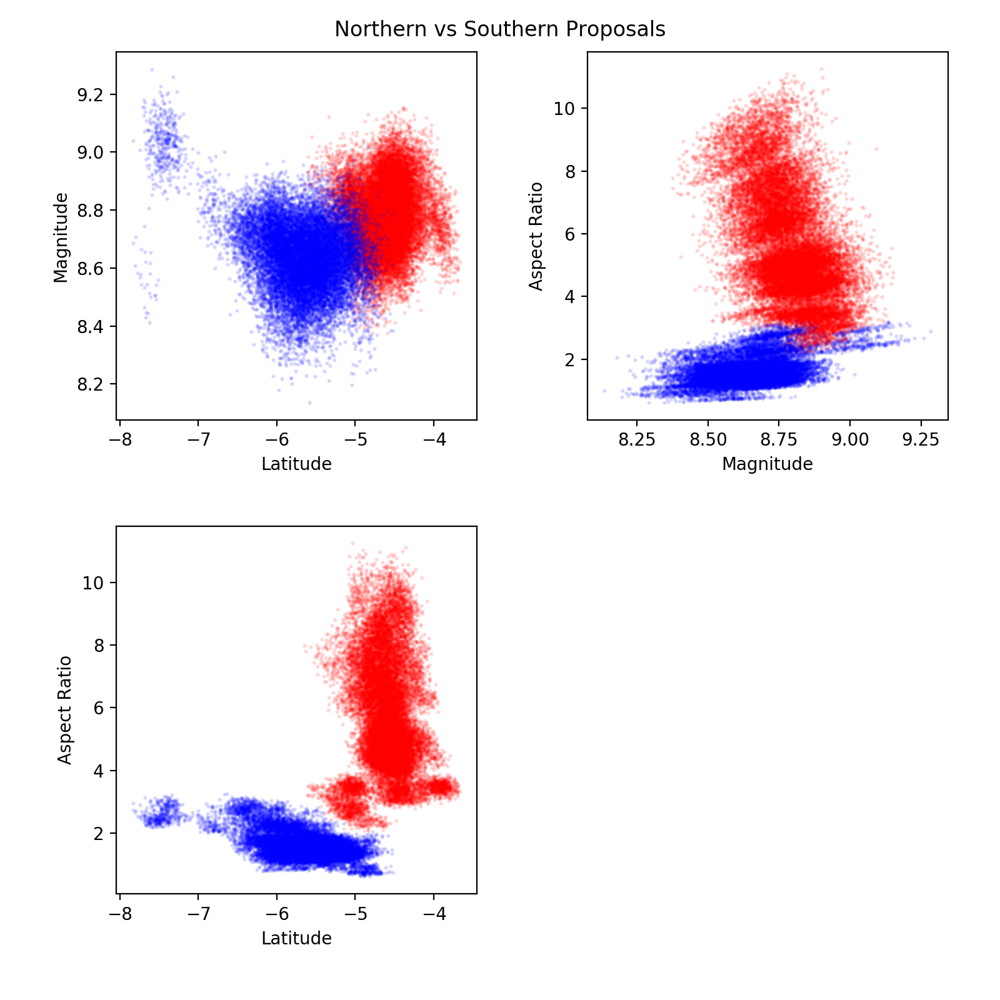

In [43]:
n = 1
fig = plt.figure(figsize=(8,8))
ax = plt.subplot(2,2,1)
ax.scatter(n_debug['p_latitude'].iloc[::n],n_debug['p_magnitude'].iloc[::n],c='r',s=2,alpha=.1,label='Northern')
ax.scatter(s_debug['p_latitude'].iloc[::n],s_debug['p_magnitude'].iloc[::n],c='b',s=2,alpha=.1,label='Southern')
ax.set_xlabel('Latitude')
ax.set_ylabel('Magnitude')
# plt.title('Latitude vs Magnitude')

ax = plt.subplot(2,2,2)
ax.scatter(n_debug['p_magnitude'].iloc[::n],n_debug['p_aspect_ratio'].iloc[::n],c='r',s=2,alpha=.1)
ax.scatter(s_debug['p_magnitude'].iloc[::n],s_debug['p_aspect_ratio'].iloc[::n],c='b',s=2,alpha=.1)
ax.set_xlabel('Magnitude')
ax.set_ylabel('Aspect Ratio')
# plt.title('Magnitude vs Aspect Ratio')

ax = plt.subplot(2,2,3)
ax.scatter(n_debug['p_latitude'].iloc[::n],n_debug['p_aspect_ratio'].iloc[::n],c='r',s=2,alpha=.1)
ax.scatter(s_debug['p_latitude'].iloc[::n],s_debug['p_aspect_ratio'].iloc[::n],c='b',s=2,alpha=.1)
ax.set_xlabel('Latitude')
ax.set_ylabel('Aspect Ratio')
# plt.title("Latitude vs Aspect Ratio")
fig.suptitle("Northern vs Southern Proposals")
plt.tight_layout(pad=3)
plt.savefig("n_vs_s_proposals.pdf")

<IPython.core.display.Javascript object>


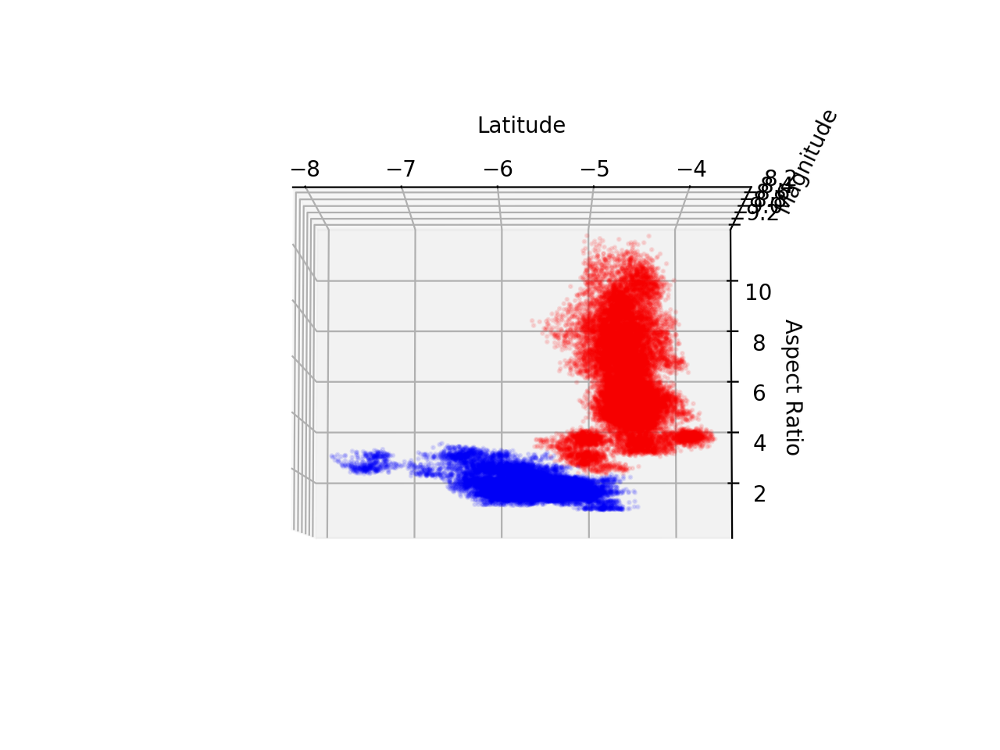

In [189]:
n = 1
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(n_debug['p_latitude'].iloc[::n],n_debug['p_magnitude'].iloc[::n],n_debug['p_aspect_ratio'].iloc[::n],c='r',s=2,alpha=.1)
ax.scatter(s_debug['p_latitude'].iloc[::n],s_debug['p_magnitude'].iloc[::n],s_debug['p_aspect_ratio'].iloc[::n],c='b',s=2,alpha=.1)
ax.set_xlabel('Latitude')
ax.set_ylabel('Magnitude')
ax.set_zlabel('Aspect Ratio')
plt.show()

In [45]:
mask_n = np.array((n_debug.p_latitude>-5.5)&(n_debug.p_latitude<-4.5))
mask_s = np.array((s_debug.p_latitude>-5.5)&(s_debug.p_latitude<-4.5))

<IPython.core.display.Javascript object>


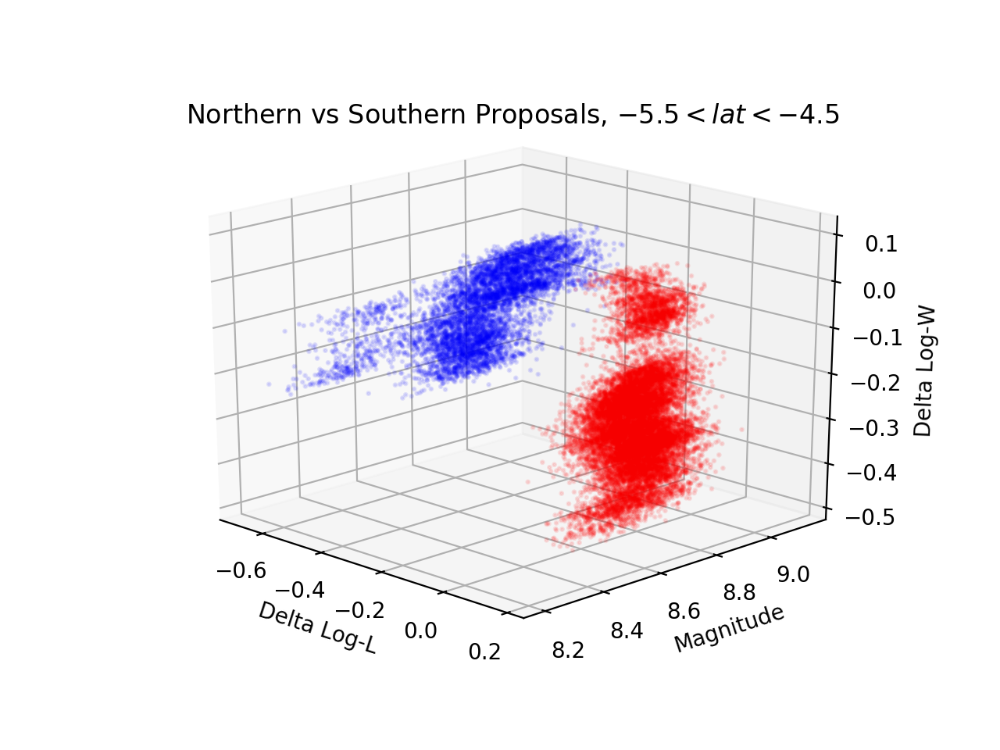

In [49]:
n = 1
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(n_debug['p_delta_logl'].iloc[mask_n].iloc[::n],
           n_debug['p_magnitude'].iloc[mask_n].iloc[::n],
           n_debug['p_delta_logw'].iloc[mask_n].iloc[::n],
           c='r',s=2,alpha=.1)
ax.scatter(s_debug['p_delta_logl'].iloc[mask_s].iloc[::n],
           s_debug['p_magnitude'].iloc[mask_s].iloc[::n],
           s_debug['p_delta_logw'].iloc[mask_s].iloc[::n],
           c='b',s=2,alpha=.1)
ax.set_xlabel('Delta Log-L')
ax.set_ylabel('Magnitude')
ax.set_zlabel('Delta Log-W')
plt.title("Northern vs Southern Proposals, $-5.5 < lat < -4.5$")
plt.savefig("n_vs_s_deltap3d.pdf")

<IPython.core.display.Javascript object>


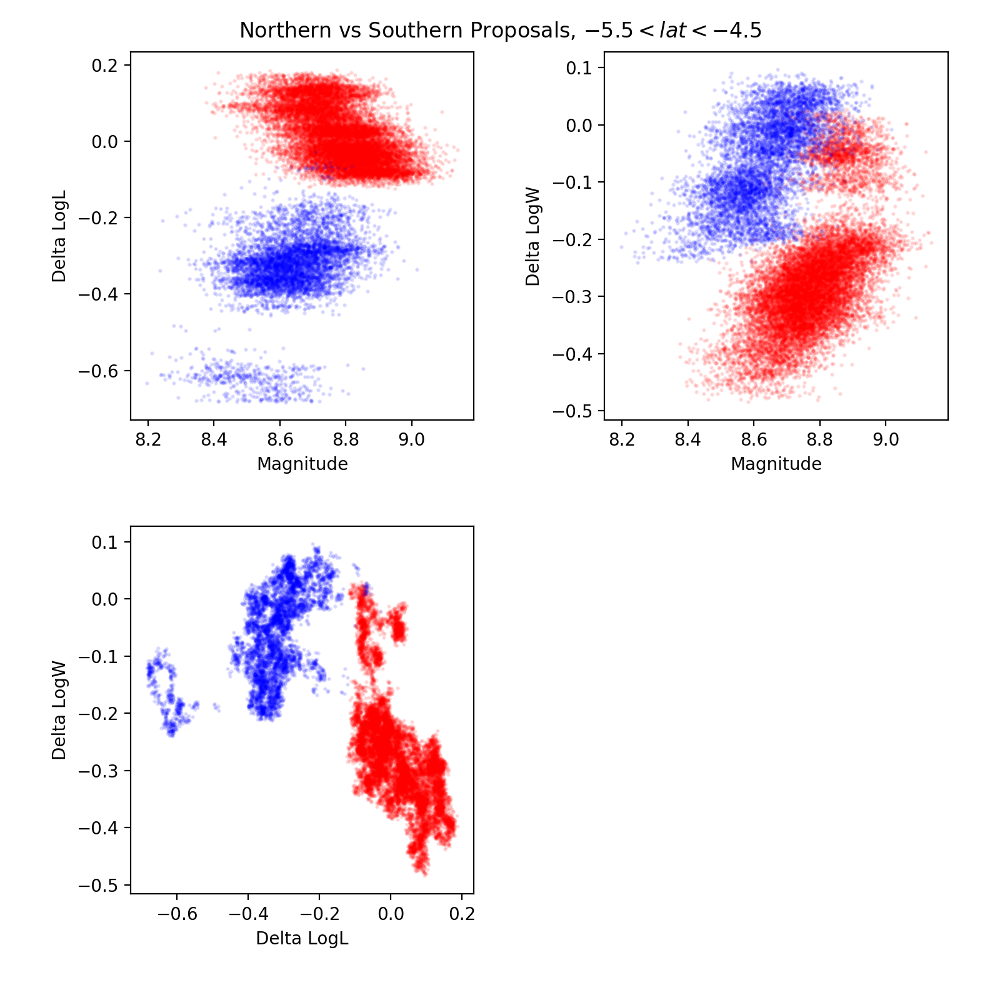

In [52]:
n = 1
fig = plt.figure(figsize=(8,8))
ax = plt.subplot(2,2,1)
ax.scatter(n_debug['p_magnitude'].iloc[mask_n].iloc[::n],
           n_debug['p_delta_logl'].iloc[mask_n].iloc[::n],
           c='r',s=2,alpha=.1,label='Northern')
ax.scatter(s_debug['p_magnitude'].iloc[mask_s].iloc[::n],
           s_debug['p_delta_logl'].iloc[mask_s].iloc[::n],
           c='b',s=2,alpha=.1,label='Southern')
ax.set_xlabel('Magnitude')
ax.set_ylabel('Delta LogL')
# plt.title('Latitude vs Magnitude')

ax = plt.subplot(2,2,2)
ax.scatter(n_debug['p_magnitude'].iloc[mask_n].iloc[::n],
           n_debug['p_delta_logw'].iloc[mask_n].iloc[::n],
           c='r',s=2,alpha=.1,label='Northern')
ax.scatter(s_debug['p_magnitude'].iloc[mask_s].iloc[::n],
           s_debug['p_delta_logw'].iloc[mask_s].iloc[::n],
           c='b',s=2,alpha=.1,label='Southern')
ax.set_xlabel('Magnitude')
ax.set_ylabel('Delta LogW')
# plt.title('Magnitude vs Aspect Ratio')

ax = plt.subplot(2,2,3)
ax.scatter(n_debug['p_delta_logl'].iloc[mask_n].iloc[::n],
           n_debug['p_delta_logw'].iloc[mask_n].iloc[::n],
           c='r',s=2,alpha=.1,label='Northern')
ax.scatter(s_debug['p_delta_logl'].iloc[mask_s].iloc[::n],
           s_debug['p_delta_logw'].iloc[mask_s].iloc[::n],
           c='b',s=2,alpha=.1,label='Southern')
ax.set_xlabel('Delta LogL')
ax.set_ylabel('Delta LogW')
# plt.title("Latitude vs Aspect Ratio")
fig.suptitle("Northern vs Southern Proposals, $-5.5 < lat < -4.5$")
plt.tight_layout(pad=3)
plt.savefig("n_vs_s_pdelta.pdf")

In [ ]:
mask_n = np.array((n_debug.latitude>-5.5)&(n_debug.latitude<-4.5))
mask_s = np.array((s_debug.latitude>-5.5)&(s_debug.latitude<-4.5))

<IPython.core.display.Javascript object>


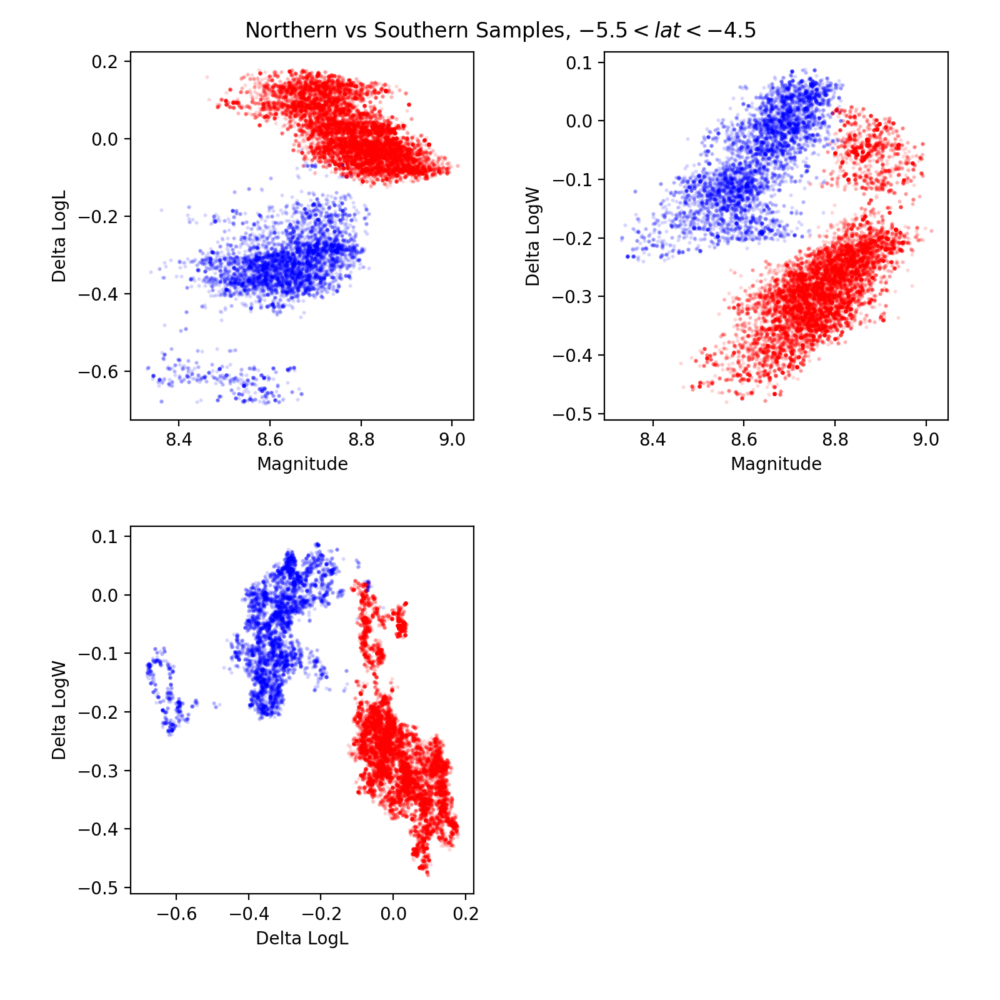

In [53]:
n = 1
fig = plt.figure(figsize=(8,8))
ax = plt.subplot(2,2,1)
ax.scatter(n_debug['magnitude'].iloc[mask_n].iloc[::n],
           n_debug['delta_logl'].iloc[mask_n].iloc[::n],
           c='r',s=2,alpha=.1,label='Northern')
ax.scatter(s_debug['magnitude'].iloc[mask_s].iloc[::n],
           s_debug['delta_logl'].iloc[mask_s].iloc[::n],
           c='b',s=2,alpha=.1,label='Southern')
ax.set_xlabel('Magnitude')
ax.set_ylabel('Delta LogL')
# plt.title('Latitude vs Magnitude')

ax = plt.subplot(2,2,2)
ax.scatter(n_debug['magnitude'].iloc[mask_n].iloc[::n],
           n_debug['delta_logw'].iloc[mask_n].iloc[::n],
           c='r',s=2,alpha=.1,label='Northern')
ax.scatter(s_debug['magnitude'].iloc[mask_s].iloc[::n],
           s_debug['delta_logw'].iloc[mask_s].iloc[::n],
           c='b',s=2,alpha=.1,label='Southern')
ax.set_xlabel('Magnitude')
ax.set_ylabel('Delta LogW')
# plt.title('Magnitude vs Aspect Ratio')

ax = plt.subplot(2,2,3)
ax.scatter(n_debug['delta_logl'].iloc[mask_n].iloc[::n],
           n_debug['delta_logw'].iloc[mask_n].iloc[::n],
           c='r',s=2,alpha=.1,label='Northern')
ax.scatter(s_debug['delta_logl'].iloc[mask_s].iloc[::n],
           s_debug['delta_logw'].iloc[mask_s].iloc[::n],
           c='b',s=2,alpha=.1,label='Southern')
ax.set_xlabel('Delta LogL')
ax.set_ylabel('Delta LogW')
# plt.title("Latitude vs Aspect Ratio")
fig.suptitle("Northern vs Southern Samples, $-5.5 < lat < -4.5$")
plt.tight_layout(pad=3)
plt.savefig("n_vs_s_pdelta.pdf")

In [61]:
[df.iloc[-1]['acceptance_rate'] for df in northern_debug]

[0.2926666666666667,
 0.2958620689655173,
 0.265,
 0.21333333333333332,
 0.2783333333333333,
 0.2423333333333333,
 0.2759450171821306,
 0.23199999999999998]

In [62]:
[df.iloc[-1]['acceptance_rate'] for df in southern_debug]

[0.4773584905660378,
 0.4650190114068441,
 0.4873333333333333,
 0.4576666666666666,
 0.4883895131086142,
 0.4692015209125475,
 0.37200000000000005]

<IPython.core.display.Javascript object>


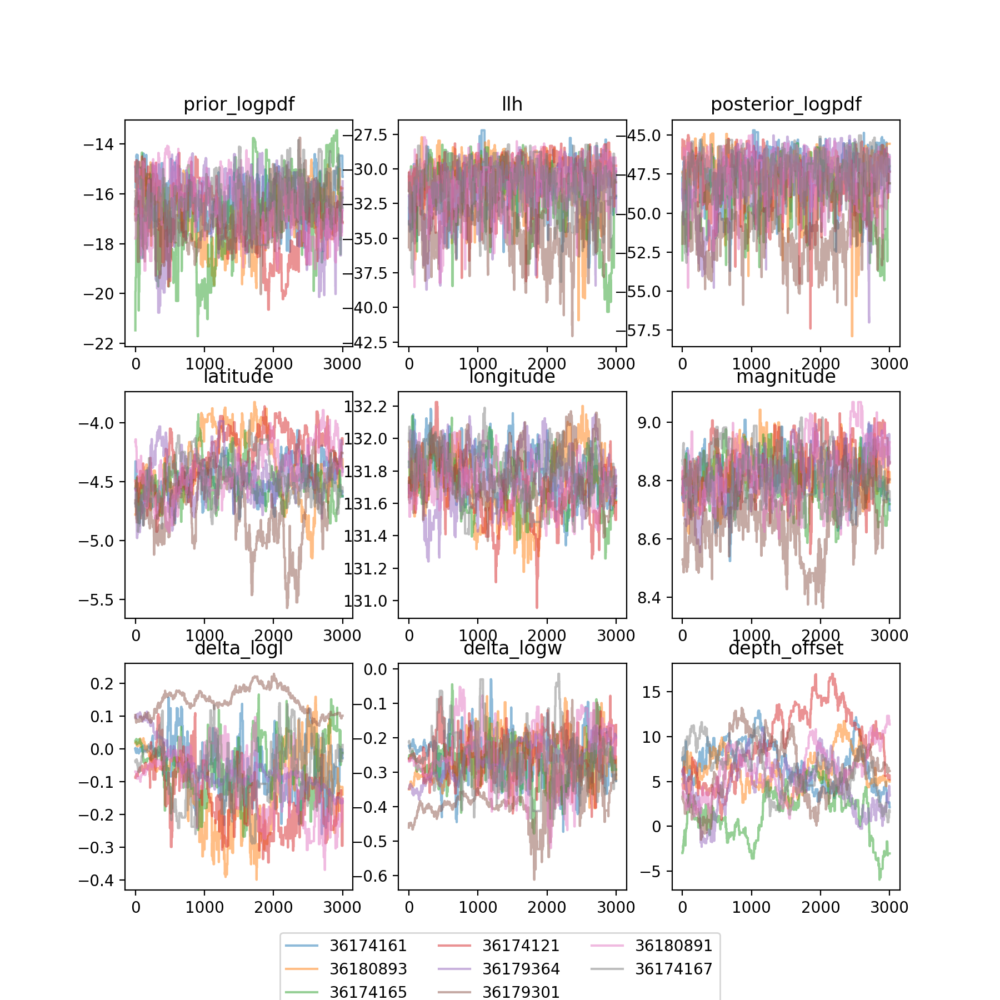

In [58]:
n=1
nburn=-3000
dfsample = northern_samples
dfdebug  = northern_debug
labs     = northern_ids
plotname = 'n_9x9_trends.pdf'
f = plt.figure(figsize=(9,9))
for i,lpdf in enumerate(np.array(['prior_logpdf','llh','posterior_logpdf'])):
    ax = plt.subplot(3,3,i+1)
    for j,df in enumerate(dfdebug):
        #         plt.plot(df[lpdf].iloc[nburn:].rolling(window=n).mean(),alpha=.5)
        plt.plot(df.iloc[nburn:].reset_index()[lpdf].rolling(window=n).mean(),alpha=.5)
    plt.title(lpdf)
for i,lpdf in enumerate(dfsample[0].columns[:-1]):
    ax = plt.subplot(3,3,i+4)
    for j,df in enumerate(dfsample):
        #         plt.plot(df[lpdf].iloc[nburn:].rolling(window=n).mean(),alpha=.5)
        plt.plot(df.iloc[nburn:].reset_index()[lpdf].rolling(window=n).mean(),alpha=.5,label=labs[j])
    plt.title(lpdf)
handles, labels = ax.get_legend_handles_labels()
f.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.075),ncol=3)
plt.show()

In [24]:
n=100
nburn=-6000
dfsample = southern_samples
dfdebug  = southern_debug
labs     = southern_ids
plotname = 's_9x9_trends.pdf'
f = plt.figure(figsize=(9,9))
for i,lpdf in enumerate(np.array(['prior_logpdf','llh','posterior_logpdf'])):
    ax = plt.subplot(3,3,i+1)
    for j,df in enumerate(dfdebug):
        #         plt.plot(df[lpdf].iloc[nburn:].rolling(window=n).mean(),alpha=.5)
        plt.plot(df.iloc[nburn:].reset_index()[lpdf].rolling(window=n).mean(),alpha=.5)
    plt.title(lpdf)
for i,lpdf in enumerate(dfsample[0].columns[:-1]):
    ax = plt.subplot(3,3,i+4)
    for j,df in enumerate(dfsample):
        #         plt.plot(df[lpdf].iloc[nburn:].rolling(window=n).mean(),alpha=.5)
        plt.plot(df.iloc[nburn:].reset_index()[lpdf].rolling(window=n).mean(),alpha=.5,label=labs[j])
    plt.title(lpdf)
handles, labels = ax.get_legend_handles_labels()
f.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.075),ncol=3)
plt.show()

NameError: name 'southern_samples' is not defined

In [50]:
all_debug['posterior_logpdf'].idxmax()

12916

In [51]:
all_debug.loc[12916]

latitude                -4.42649
longitude                131.859
magnitude                8.84126
delta_logl            -0.0291801
delta_logw             -0.297992
depth_offset              8.3213
p_latitude              -4.40256
p_longitude              131.909
p_magnitude              8.82661
p_delta_logl         -0.00909674
p_delta_logw           -0.301619
p_depth_offset            8.0277
m_latitude              -4.42649
m_longitude              131.859
length                    496303
width                    90420.7
slip                     11.4239
strike                   144.042
dip                      12.7716
depth                    13755.1
rake                          90
m_depth_offset            8.3213
p_m_latitude            -4.40256
p_m_longitude            131.909
p_length                  510695
p_width                    88768
p_slip                   10.7507
p_strike                  144.25
p_dip                    11.8269
p_depth                  12484.9
p_rake    

In [52]:
all_debug['llh'].idxmax()

27472

In [53]:
all_debug.loc[27472]

latitude                 -3.56587
longitude                 131.026
magnitude                 8.83731
delta_logl              -0.228112
delta_logw               -0.30282
depth_offset              6.90798
p_latitude               -3.51787
p_longitude               131.004
p_magnitude               8.80885
p_delta_logl            -0.223732
p_delta_logw            -0.294583
p_depth_offset            7.80578
m_latitude               -3.56587
m_longitude               131.026
length                     312425
width                     89177.7
slip                      18.1509
strike                    115.881
dip                       8.04962
depth                     9308.58
rake                           90
m_depth_offset            6.90798
p_m_latitude             -3.51787
p_m_longitude             131.004
p_length                   304951
p_width                   89120.4
p_slip                    16.8656
p_strike                  115.999
p_dip                     7.51456
p_depth       